In [2]:

import pandas as pd
import itertools
import numpy as np
import matplotlib.pyplot as plt
import json
import umap
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA

def save_block_matrix(matrix, filename):
    with open(filename, 'w') as f:
        json.dump(matrix, f)

def load_block_matrix(filename):
    with open(filename, 'r') as f:
        matrix = json.load(f)
    return matrix    


def save_dict_to_json(data_dict, filename):
    with open(filename, 'w') as f:
        json.dump(data_dict, f, indent=4)  # indent=4 makes it human-readable
def load_dict_from_json(filename):
    with open(filename, 'r') as f:
        return json.load(f)


def build_matrix(entireDataframe):
    
    correction = 1000000
    chromosomes = [f"chr{i}" for i in range(1, 23)] + ["chrX"]
    chromosomeLength = [(chrom, 0) for chrom in chromosomes]
    blockMatrix = [[0 for _ in range(23)] for _ in range(23)]



    for _, row in entireDataframe.iterrows():
        m = chromosomes.index(row[2])
        if row[3] > chromosomeLength[m][1]:
            chromosomeLength[m] = (chromosomeLength[m][0], row[3])

    
    chromosome_lengths = [
    ["chr1", 249],
    ["chr2", 243],
    ["chr3", 197],
    ["chr4", 191],
    ["chr5", 180],
    ["chr6", 171],
    ["chr7", 159],
    ["chr8", 146],
    ["chr9", 141],
    ["chr10", 135],
    ["chr11", 134],
    ["chr12", 133],
    ["chr13", 115],
    ["chr14", 107],
    ["chr15", 102],
    ["chr16", 90],
    ["chr17", 81],
    ["chr18", 78],
    ["chr19", 59],
    ["chr20", 62],
    ["chr21", 48],
    ["chr22", 51],
    ["chrX", 154]
]


    for chrom, length in chromosome_lengths:
        
        size = length
        k = chromosomes.index(chrom)
        subMatrix = [[0 for _ in range(size+1)] for _ in range(size+1)]
        blockMatrix[k][k] = subMatrix

    sum = 0

    for _, row in entireDataframe.iterrows():

        k = chromosomes.index(row[0])
        #l = chromosomes.index(row[2])
        i = int(row[1] // correction)
        j = int(row[3] // correction)

        size = chromosomeLength[k][1]


        m = chromosomes.index(row[2])
        chromosomeLength[m][1]
        
        submatrix = blockMatrix[k][k]
       
        if 0 <= i < size and 0 <= j < size:
            submatrix[i][j] = row[4]
            submatrix[j][i] = row[4]
            sum = sum + 1
   
    return blockMatrix, sum
    



In [3]:
import os
# Directory containing all your files
import platform


data_dict = {
    "GM12878": {},
    "HAP1": {},
    "Hela": {},
    "K562": {}
}

directory = ["GM12878", "HAP1","Hela","K562"]

for i in range(4):
    count = 0
    # Process all files in the directory
    num_files = len([f for f in os.listdir(directory[i]) if os.path.isfile(os.path.join(directory[i], f))])

    for filename in os.listdir(directory[i]):
        
        if filename.endswith(".txt"):  # Adjust for your actual file type
            filepath = os.path.join(directory[i], filename)
            cell_type = directory[i]
            cell_id = filename  
            dataframe = pd.read_csv(filepath, sep='\t', header=None)
            matrix, sum_of_contacts = build_matrix(dataframe)
            print(sum_of_contacts)
            # Add to dictionary
            if sum_of_contacts > 0:
                print(sum_of_contacts)
                data_dict[cell_type][cell_id] = matrix
            count = count+1
            
            

            
            print(f"{directory[i]}" + f": {count} / {num_files} Files Processed")
            


3661
3661
GM12878: 1 / 24 Files Processed
4827
4827
GM12878: 2 / 24 Files Processed
5000
5000
GM12878: 3 / 24 Files Processed
3103
3103
GM12878: 4 / 24 Files Processed
7150
7150
GM12878: 5 / 24 Files Processed
2952
2952
GM12878: 6 / 24 Files Processed
3466
3466
GM12878: 7 / 24 Files Processed
3638
3638
GM12878: 8 / 24 Files Processed
6014
6014
GM12878: 9 / 24 Files Processed
5422
5422
GM12878: 10 / 24 Files Processed
2131
2131
GM12878: 11 / 24 Files Processed
1958
1958
GM12878: 12 / 24 Files Processed
2640
2640
GM12878: 13 / 24 Files Processed
4184
4184
GM12878: 14 / 24 Files Processed
3568
3568
GM12878: 15 / 24 Files Processed
2398
2398
GM12878: 16 / 24 Files Processed
3741
3741
GM12878: 17 / 24 Files Processed
3522
3522
GM12878: 18 / 24 Files Processed
5129
5129
GM12878: 19 / 24 Files Processed
5403
5403
GM12878: 20 / 24 Files Processed
3075
3075
GM12878: 21 / 24 Files Processed
2942
2942
GM12878: 22 / 24 Files Processed
3107
3107
GM12878: 23 / 24 Files Processed
2602
2602
GM12878: 2

In [4]:
celltype_nonzero_counts = {
    "GM12878": [],
    "HAP1": [],
    "Hela": [],
    "K562": []
}

for cell_type, cell_data in data_dict.items():
    for matrix in cell_data.values():
        total_nonzeros = 0
        for i in range(23):
            submatrix = matrix[i][i]
            if submatrix is not None:
                total_nonzeros += np.count_nonzero(submatrix)
        celltype_nonzero_counts[cell_type].append(total_nonzeros)

percentile_25_list = []  # Initialize 2D list

print("25th Percentile of Total Nonzero Counts (Diagonal Only):")
for cell_type, counts in celltype_nonzero_counts.items():
    percentile_25 = np.percentile(counts, 25)
    print(f"{cell_type}: {percentile_25:.2f}")
    percentile_25_list.append([cell_type, percentile_25])


filtered_data_dict = {
    "GM12878": {},
    "HAP1": {},
    "Hela": {},
    "K562": {}
}


# Convert 2D list to a dictionary for quick lookup
percentile_thresholds = {cell_type: value for cell_type, value in percentile_25_list}


# Loop through original data_dict and filter based on percentile threshold
for cell_type, cell_data in data_dict.items():
    threshold = percentile_thresholds[cell_type]
    for cell_id, matrix in cell_data.items():
        total_nonzeros = 0
        for i in range(23):
            submatrix = matrix[i][i]
            if submatrix is not None:
                total_nonzeros += np.count_nonzero(submatrix)
        
        if total_nonzeros >= threshold:
            filtered_data_dict[cell_type][cell_id] = matrix

# Optional: print how many files were retained per cell type
print("\nRetained files per cell type (≥ 25th percentile):")
for cell_type in filtered_data_dict:
    print(f"{cell_type}: {len(filtered_data_dict[cell_type])} files")





25th Percentile of Total Nonzero Counts (Diagonal Only):
GM12878: 4392.50
HAP1: 5397.00
Hela: 7545.75
K562: 4350.25

Retained files per cell type (≥ 25th percentile):
GM12878: 18 files
HAP1: 688 files
Hela: 1216 files
K562: 36 files


In [ ]:

summary_statistics = []
chromosomes = [f"chr{i}" for i in range(1, 23)] + ["chrX"]
directory = ["GM12878", "HAP1","Hela","K562"]
chromosomes_to_remove = []#"chr4", "chr6", "chrX"] #"chr7" ,"chr2" ,"chr13" ,"chr18" ,"chr10"]


for i in range(4):
    for cell_id, matrix in filtered_data_dict[directory[i]].items():
        cell_vector = [directory[i]]

        for j in range(23):
            chrom_name = chromosomes[j]
            if chrom_name not in chromosomes_to_remove:
                chromosome_matrix = matrix[j][j]
                diagonal = np.diag(chromosome_matrix)
                to_process = np.array(chromosome_matrix)

                


                N = to_process.shape[0]
                # Count nonzero entries in the upper triangle, excluding the diagonal
                E = np.count_nonzero(np.triu(to_process, k=1))

                # Compute density
                density = (2 * E) / (N * (N - 1))
                
                sum_of_contacts = np.sum(to_process) / N
                variance_of_contacts = np.var(to_process)
                total_zero_count = np.count_nonzero(to_process == 0)
                nonzero_element_count =int((len(chromosome_matrix))**2 - total_zero_count) / N
                total_nonzero_ratio = 1 - ( total_zero_count / len(chromosome_matrix)**2 ) 
                zero_along_diagonal_count = np.count_nonzero(diagonal == 0) / N
                zero_ratio_along_diagonal = zero_along_diagonal_count/len(diagonal)
                variance_along_diagonal  = np.var(diagonal)
                variance_off_diagonal = np.var(to_process[~np.eye(to_process.shape[0], dtype=bool)])
                trace = np.sum(diagonal) / N


                cell_vector.extend([
                    sum_of_contacts, 
                    trace, 
                    variance_of_contacts,  
                    variance_along_diagonal,
                    variance_off_diagonal,
                    density, 
                    total_nonzero_ratio, 
                    zero_ratio_along_diagonal, 
                ])
            
        summary_statistics.append(cell_vector)
            










In [27]:
import pandas as pd

# Define chromosomes and metrics
chromosomes = [f"chr{i}" for i in range(1, 23)] + ["chrX"]
metrics = [
    "sum", 
    "trace", 
    "variance", 
    "variance_along_diagonal",
    "variance_off_diagonal",
    "density", 
    "nonzero_ratio", 
    "diagonal_zero_ratio"
]

# Build column names
columns = ["cell_type"]
for chrom in chromosomes:
    for metric in metrics:
        columns.append(f"{chrom}_{metric}")

# Convert list to DataFrame
summary_stats_df = pd.DataFrame(summary_statistics, columns=columns)

In [ ]:
import pandas as pd
import numpy as np
from itertools import combinations

# Define your inputs
chromosomes = [f"chr{i}" for i in range(1, 23)] + ["chrX"]
metrics = [
    "sum", 
    "trace", 
    "variance", 
    "variance_along_diagonal",
    "variance_off_diagonal",
    "density", 
    "nonzero_ratio", 
    "diagonal_zero_ratio"
]

# Create list to hold results
pairwise_variance_results = []

# Loop through each chromosome + metric combo
for chrom in chromosomes:
    for metric in metrics:
        col_name = f"{chrom}_{metric}"
        if col_name not in summary_stats_df.columns:
            continue  # Skip missing data
        # Step 1: group by cell type and get mean of that stat
        means = summary_stats_df.groupby("cell_type")[col_name].mean()
        # Step 2: compute pairwise squared differences
        squared_diffs = [(val1 - val2)**2 for (_, val1), (_, val2) in combinations(means.items(), 2)]
        # Step 3: take mean of those
        avg_var = np.mean(squared_diffs)
        # Step 4: save result
        pairwise_variance_results.append([chrom, metric, avg_var])

# Convert to DataFrame
ranking_df = pd.DataFrame(pairwise_variance_results, columns=["chromosome", "metric", "avg_pairwise_variance"])

# Sort by variance descending
ranking_df = ranking_df.sort_values(by="avg_pairwise_variance", ascending=False).reset_index(drop=True)

# Display top N
print(ranking_df.head(92))





   chromosome                   metric  avg_pairwise_variance
0       chr15  variance_along_diagonal             829.654727
1        chr5  variance_along_diagonal             421.304259
2        chr9  variance_along_diagonal             380.642986
3       chr20  variance_along_diagonal             294.234289
4       chr11  variance_along_diagonal             277.540783
..        ...                      ...                    ...
87      chr20    variance_off_diagonal               0.139149
88       chrX                 variance               0.121150
89       chr1                 variance               0.114929
90       chr6                 variance               0.111852
91      chr18    variance_off_diagonal               0.072563

[92 rows x 3 columns]


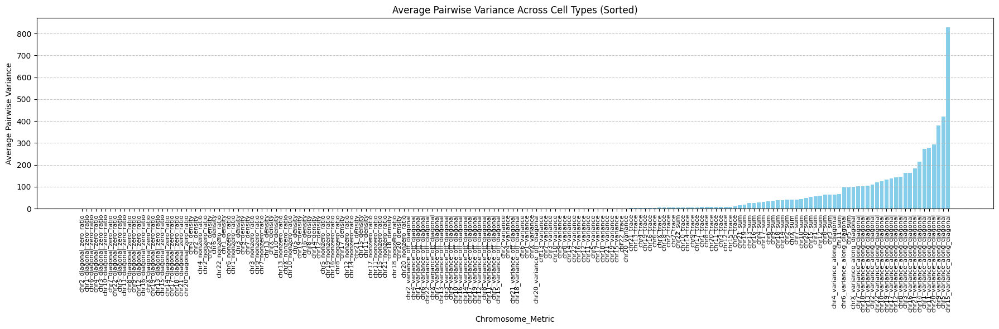

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Ensure ranking_df exists — if not, build it using earlier steps

# Sort the results in increasing order of pairwise variance
ranking_df_sorted = ranking_df.sort_values(by="avg_pairwise_variance", ascending=True).copy()

# Create a label for each bar: "chr1_sum", "chr1_trace", etc.
ranking_df_sorted["label"] = ranking_df_sorted["chromosome"] + "_" + ranking_df_sorted["metric"]

# Plot as a bar chart
plt.figure(figsize=(18, 6))
plt.bar(ranking_df_sorted["label"], ranking_df_sorted["avg_pairwise_variance"], color='skyblue')

# Formatting
plt.xticks(rotation=90, fontsize=8)
plt.ylabel("Average Pairwise Variance")
plt.xlabel("Chromosome_Metric")
plt.title("Average Pairwise Variance Across Cell Types (Sorted)")
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Show the plot
plt.show()





top_92 = ranking_df.sort_values(by="avg_pairwise_variance", ascending=False).head(92)

# Optional: store as a list of (chromosome, metric) tuples
top_92_columns = [f"{chrom}_{metric}" for chrom, metric in zip(top_92["chromosome"], top_92["metric"])]



In [36]:
 #nclude "cell_type" for grouping/labeling
selected_columns = ["cell_type"] + top_92_columns

# Create the new DataFrame
summary_stats_top92_df = summary_stats_df[selected_columns].copy()

# Optional: preview
print(summary_stats_top92_df.head())

  cell_type  chr15_variance_along_diagonal  chr5_variance_along_diagonal  \
0   GM12878                       1.580168                      1.287445   
1   GM12878                       1.587520                      1.750069   
2   GM12878                       2.085965                      1.759348   
3   GM12878                       0.899802                      0.871890   
4   GM12878                       3.853521                      4.171729   

   chr9_variance_along_diagonal  chr20_variance_along_diagonal  \
0                      2.754215                       1.170068   
1                      1.992859                       2.657596   
2                      1.493999                       1.403376   
3                      1.013936                       1.285462   
4                      4.425759                       3.456286   

   chr11_variance_along_diagonal  chr1_variance_along_diagonal  \
0                       2.582167                      0.927104   
1             

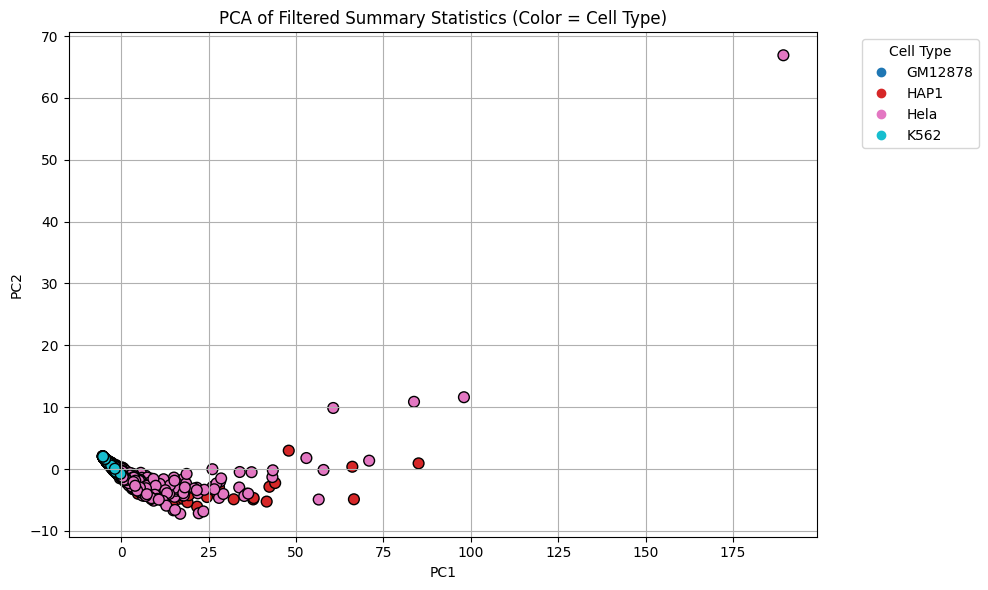

Explained variances (eigenvalues): [82.61312808  4.98128498]
Explained variance ratio: [0.89751017 0.05411675]
Cumulative variance explained: [0.89751017 0.95162692]


'\n\nreducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric=\'correlation\', random_state=42)\nX_umap = reducer.fit_transform(X_pca)\n\n\n\nplt.figure(figsize=(10, 6))\nscatter = plt.scatter(\n    X_umap[:, 0], X_umap[:, 1],\n    c=cell_type_codes,\n    cmap=\'tab10\',\n    edgecolor=\'k\',\n    s=60\n)\n\nhandles, _ = scatter.legend_elements()\nplt.legend(handles, cell_type_labels, title="Cell Type", bbox_to_anchor=(1.05, 1), loc=\'upper left\')\nplt.title(f"UMAP Projection (after PCA preprocessing)")\nplt.xlabel("UMAP 1")\nplt.ylabel("UMAP 2")\nplt.grid(True)\nplt.tight_layout()\nplt.show()\n\n\n\n\n'

In [39]:






X = summary_stats_top92_df.iloc[:, 1:].values  # only summary stats (exclude cell_type and chromosome)



scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)



pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)



cell_type_codes, cell_type_labels = pd.factorize(summary_stats_top92_df["cell_type"])

# ---------------------------------------
# Step 6: Plot PCA Results with Color Coding
# ---------------------------------------

plt.figure(figsize=(10, 6))

# Create scatter plot with cell-type-specific colors
scatter = plt.scatter(
    X_pca[:, 0], X_pca[:, 1],
    c=cell_type_codes,          # Colors assigned based on cell type
    cmap='tab10',               # Categorical colormap with up to 10 colors
    edgecolor='k',              # Outline around each point
    s=60                        # Size of points
)



# Add legend using scatter.legend_elements() and map to actual cell type labels
handles, _ = scatter.legend_elements()
plt.legend(handles, cell_type_labels, title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')

# Plot formatting
plt.title("PCA of Filtered Summary Statistics (Color = Cell Type)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.grid(True)
plt.tight_layout()
plt.show()

# ---------------------------------------
# Optional: View explained variance ratio
# ---------------------------------------

print("Explained variances (eigenvalues):", pca.explained_variance_[:10])

# Print the proportion of variance each explains
print("Explained variance ratio:", pca.explained_variance_ratio_[:10])

# Optional: Cumulative sum to see how much total variance you're capturing
print("Cumulative variance explained:", np.cumsum(pca.explained_variance_ratio_[:10]))




















"""

reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='correlation', random_state=42)
X_umap = reducer.fit_transform(X_pca)



plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    X_umap[:, 0], X_umap[:, 1],
    c=cell_type_codes,
    cmap='tab10',
    edgecolor='k',
    s=60
)

handles, _ = scatter.legend_elements()
plt.legend(handles, cell_type_labels, title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title(f"UMAP Projection (after PCA preprocessing)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.grid(True)
plt.tight_layout()
plt.show()




"""









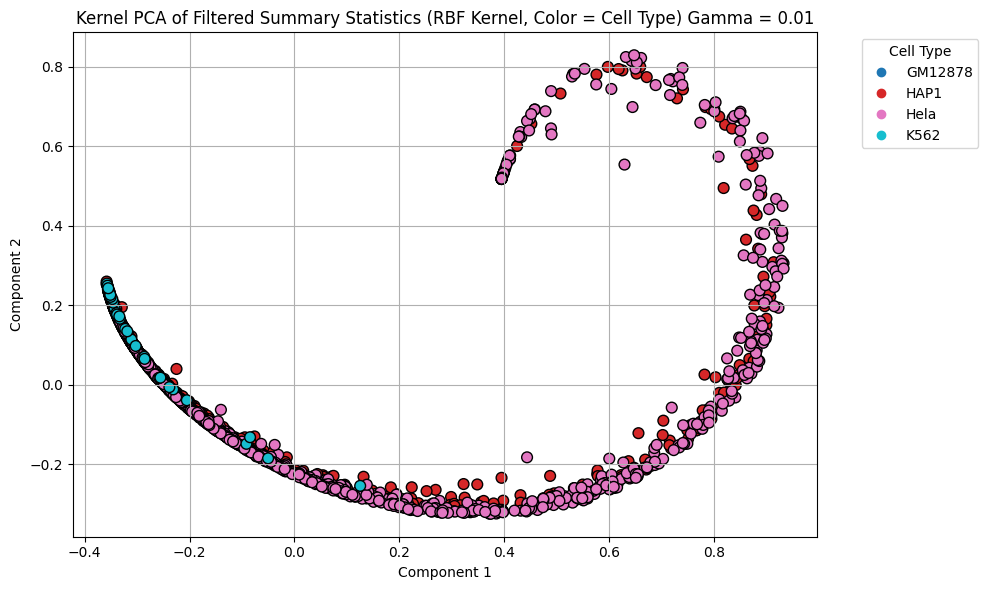

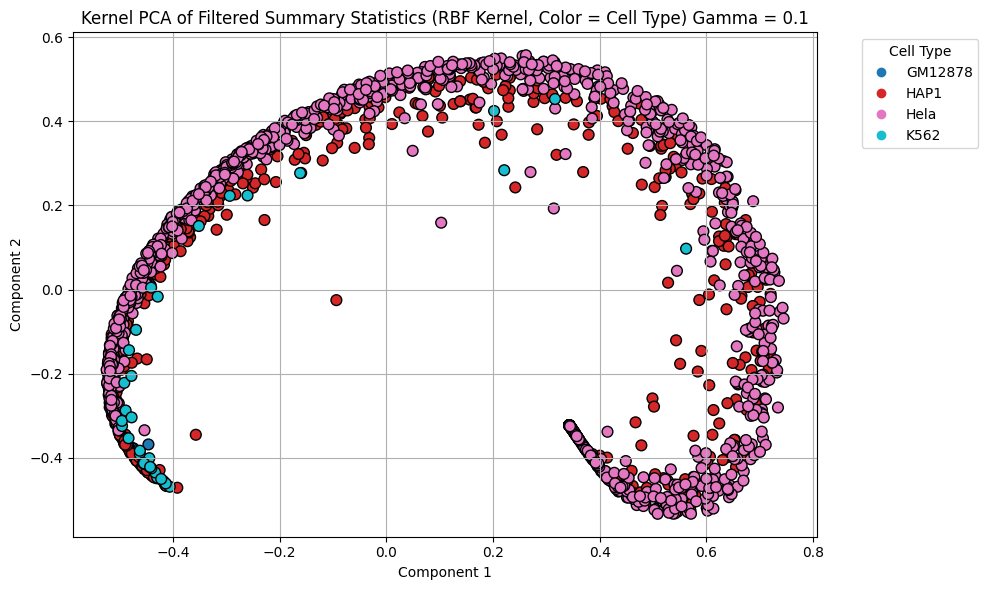

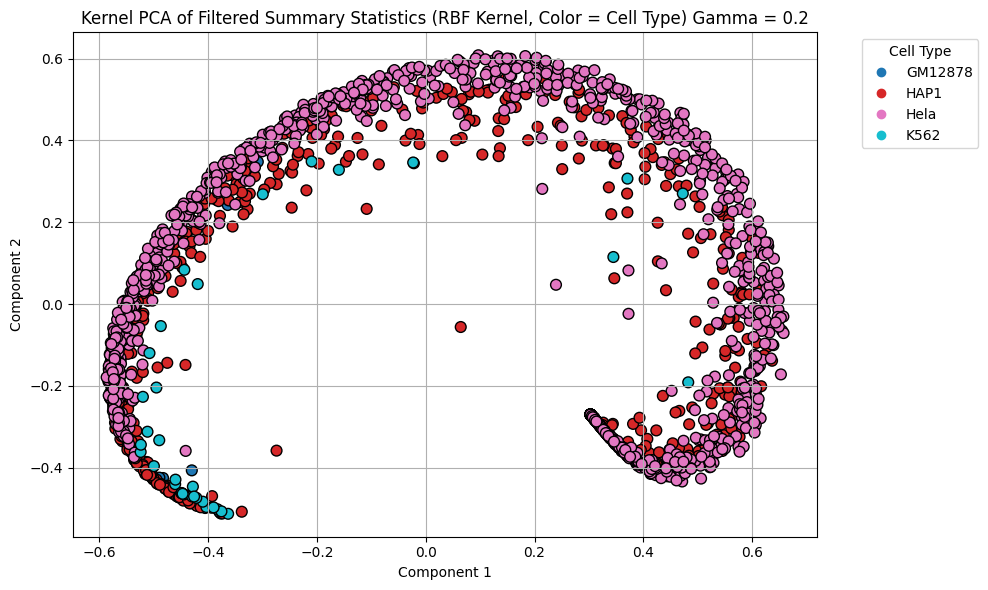

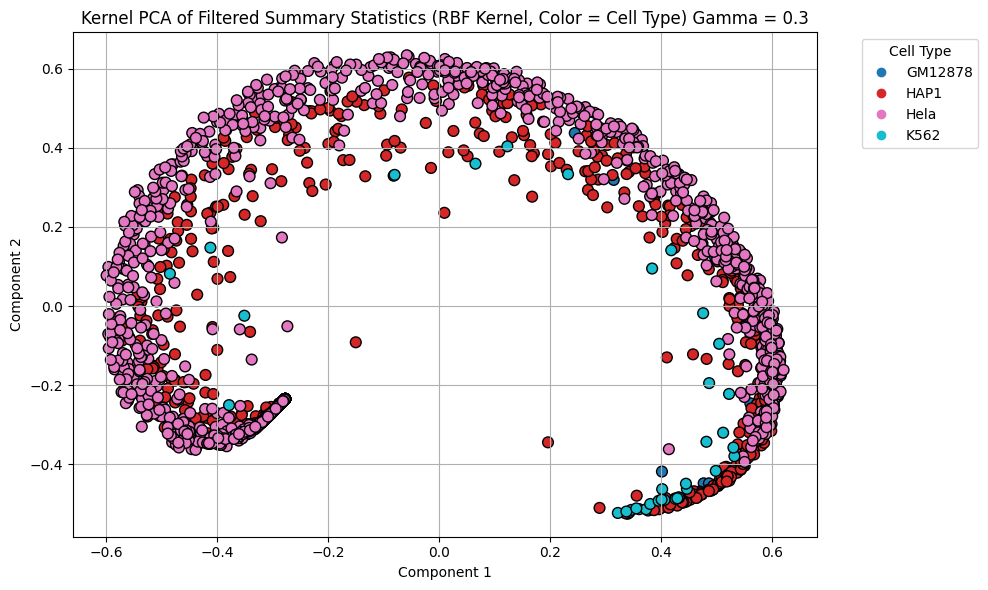

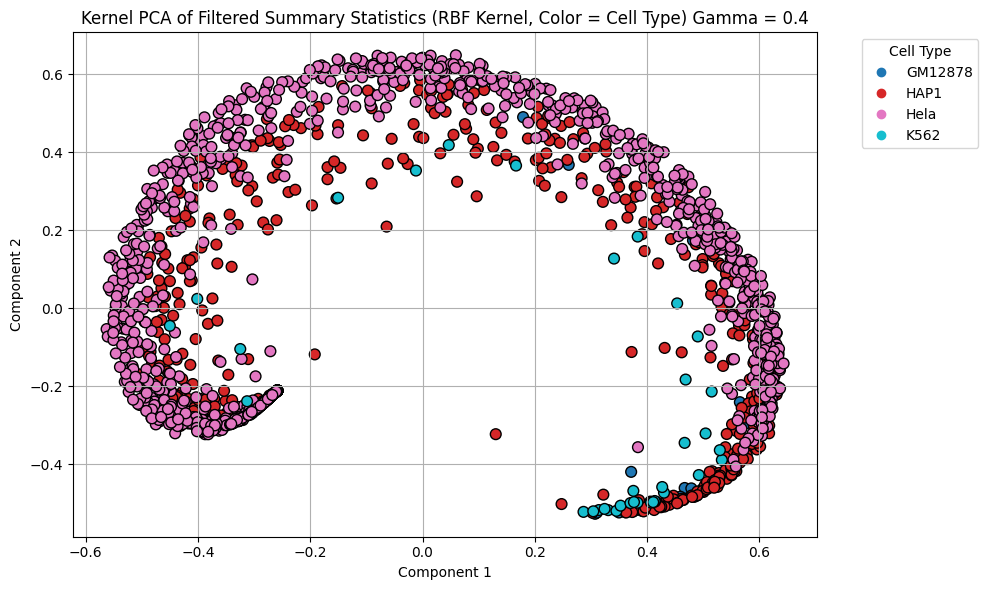

...

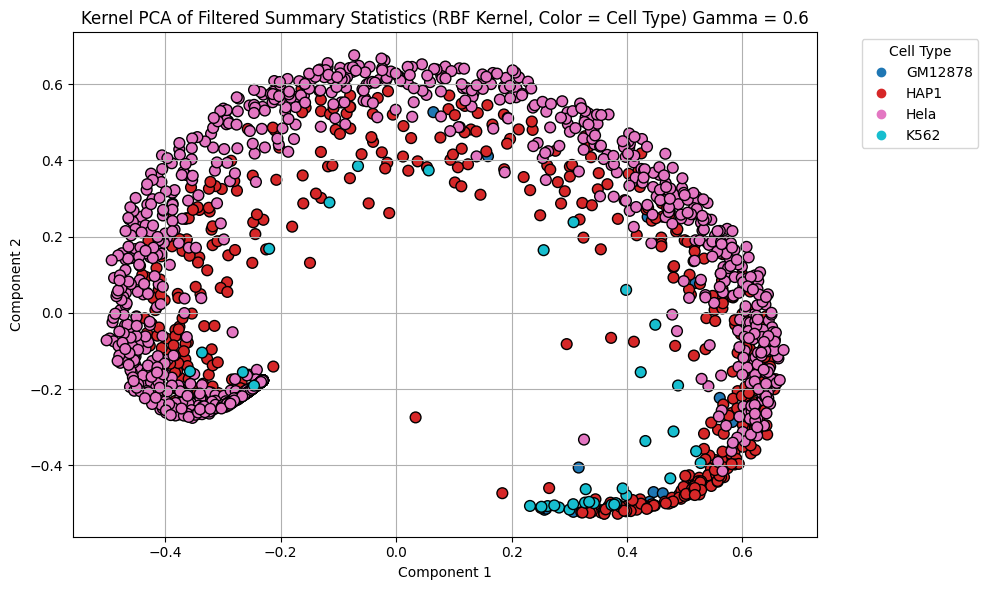

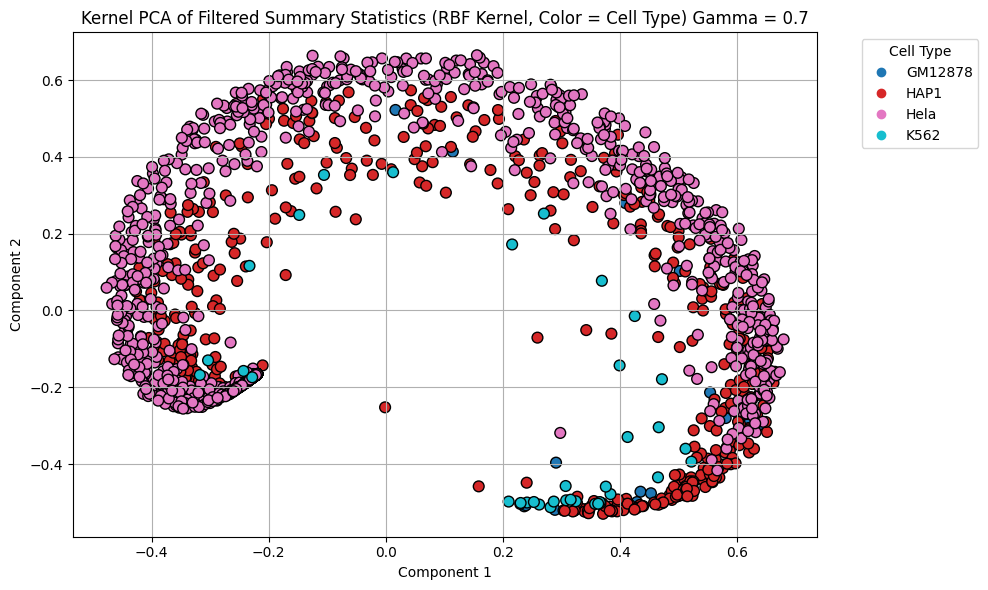

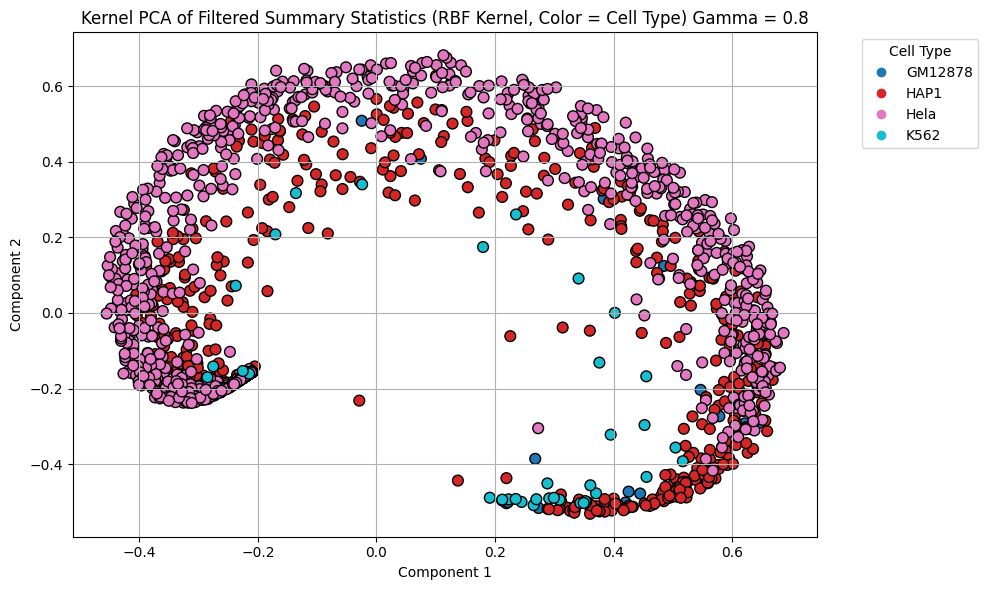

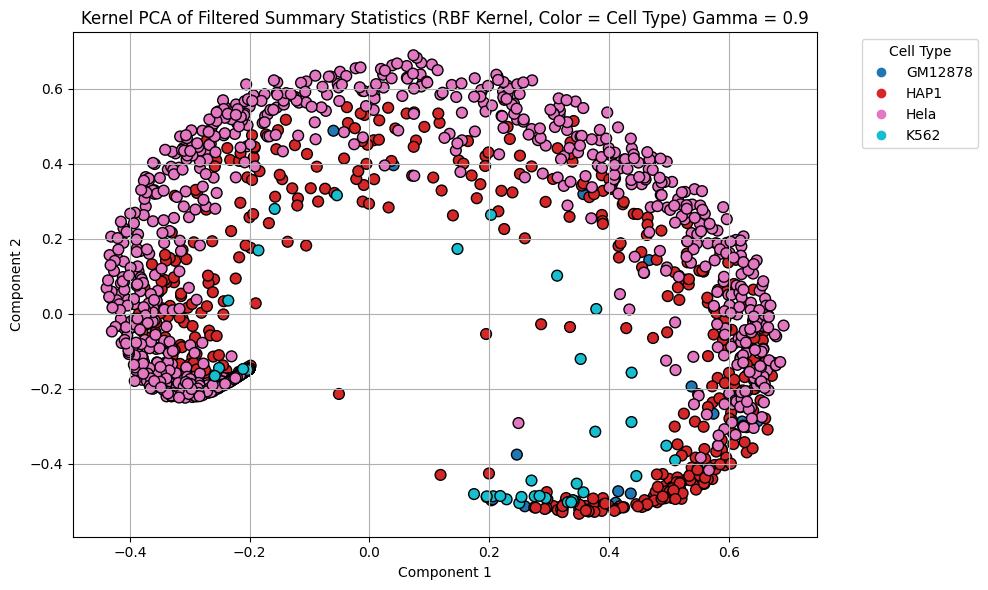

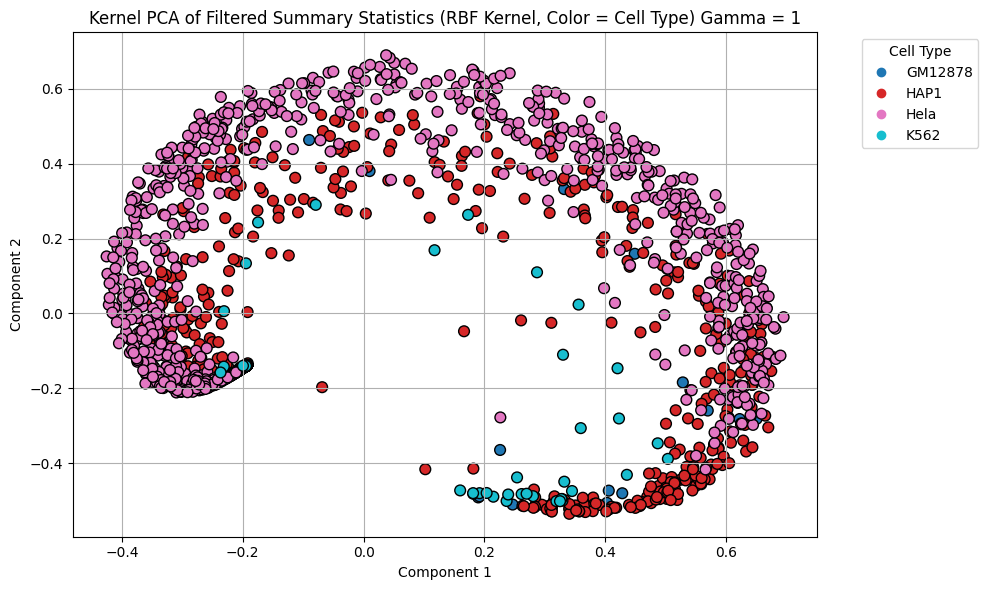

In [40]:
from sklearn.decomposition import KernelPCA

gamma_values = [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]

for i in range (11):
    kpca = KernelPCA(n_components=2, kernel='rbf', gamma=gamma_values[i])  # try 0.01, 0.1, 1 depending on scale
    X_kpca = kpca.fit_transform(X_scaled)


    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(
        X_kpca[:, 0], X_kpca[:, 1],
        c=cell_type_codes,
        cmap='tab10',
        edgecolor='k',
        s=60
    )

    # Optional: annotate chromosomes
    #for i, chrom in enumerate(df_filtered["chromosome"]):
      #  plt.text(X_kpca[i, 0], X_kpca[i, 1], chrom, fontsize=8, alpha=0.5)

    handles, _ = scatter.legend_elements()
    plt.legend(handles, cell_type_labels, title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')

    plt.title(f"Kernel PCA of Filtered Summary Statistics (RBF Kernel, Color = Cell Type) Gamma = {gamma_values[i]}")
    plt.xlabel("Component 1")
    plt.ylabel("Component 2")
    plt.grid(True)
    plt.tight_layout()
    plt.show()



c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


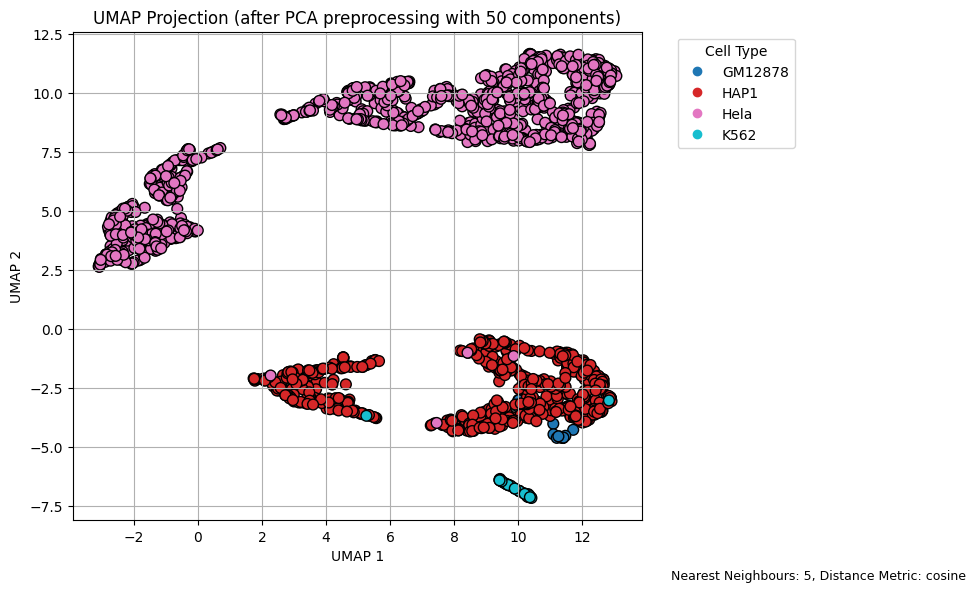

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


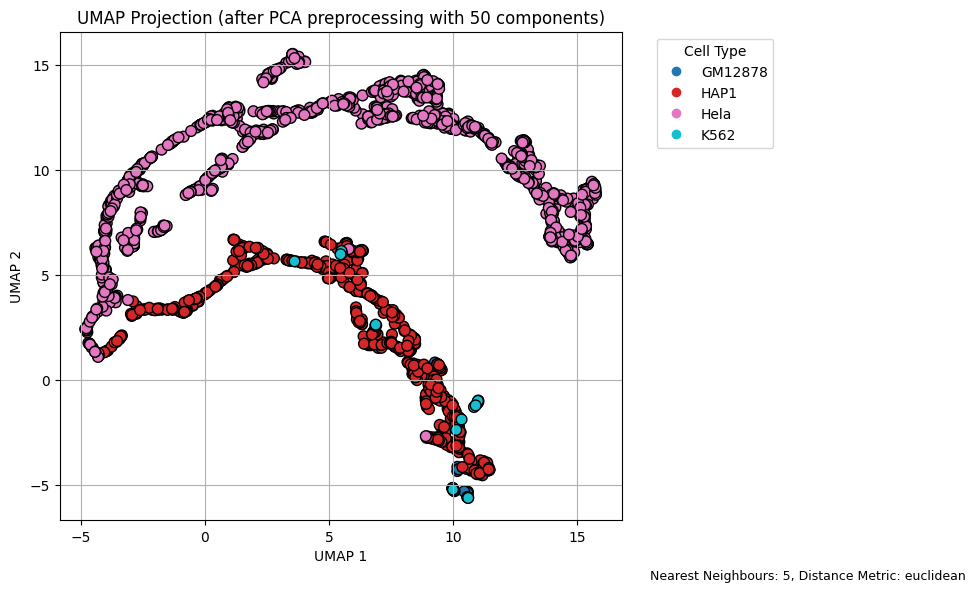

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


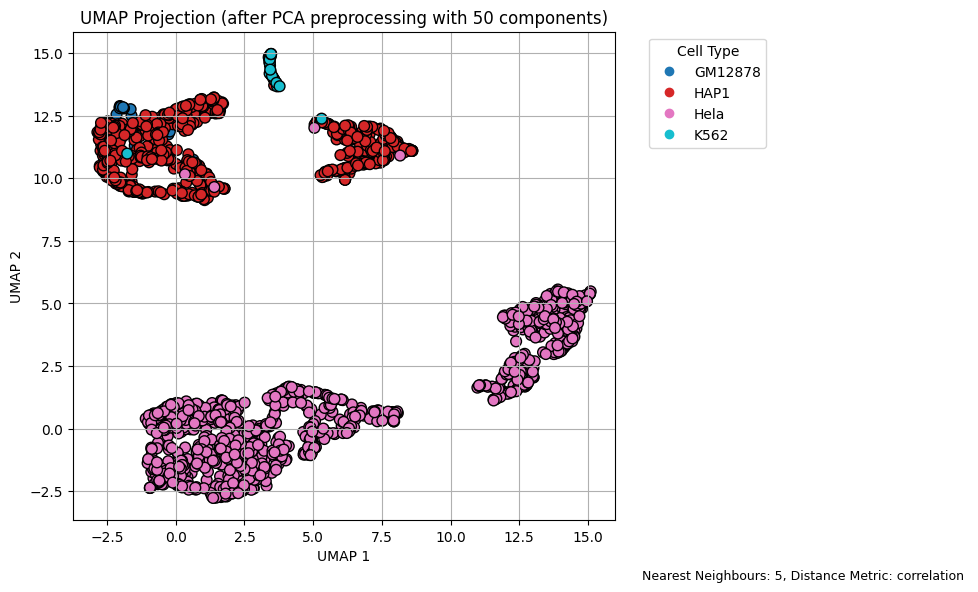

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


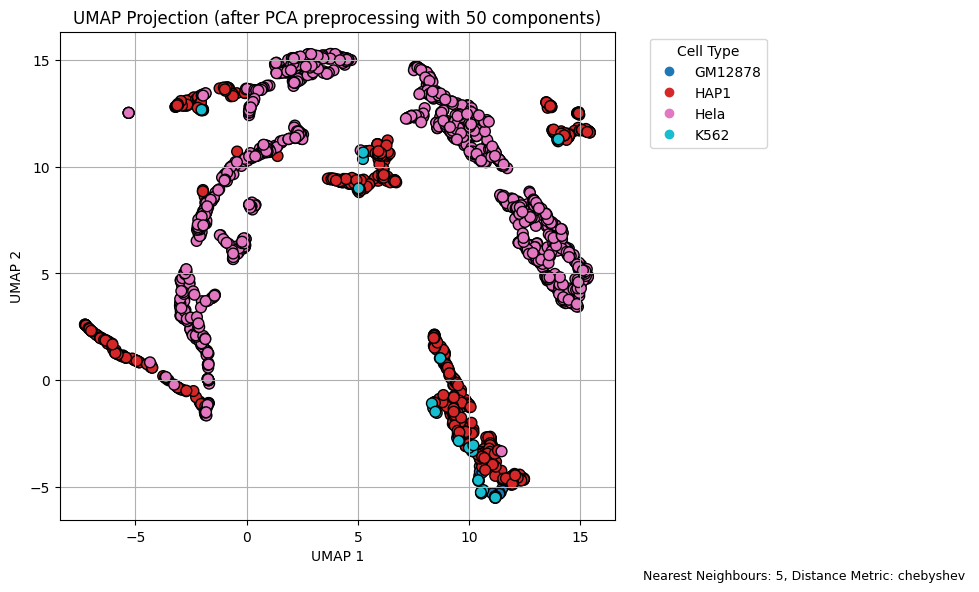

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


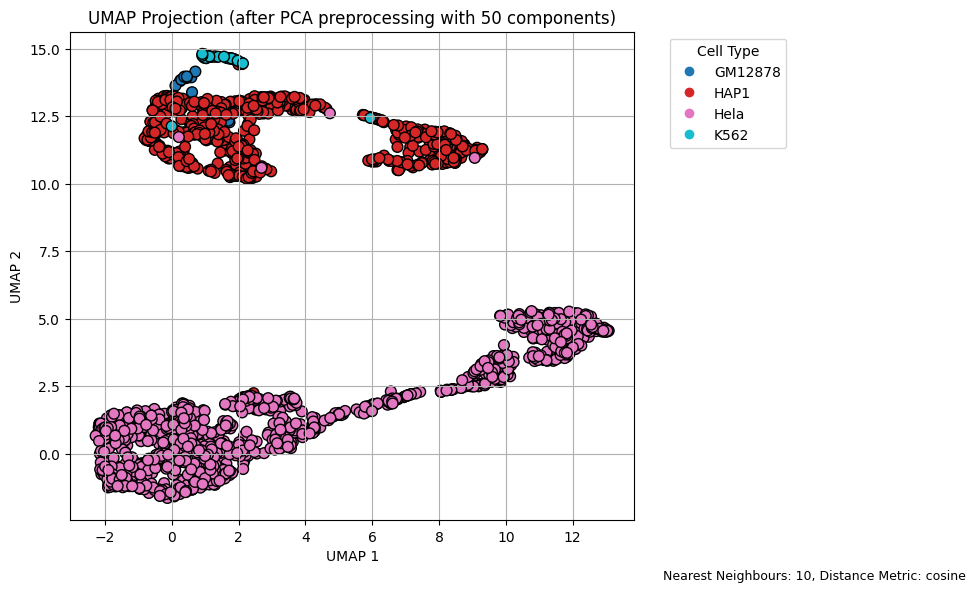

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


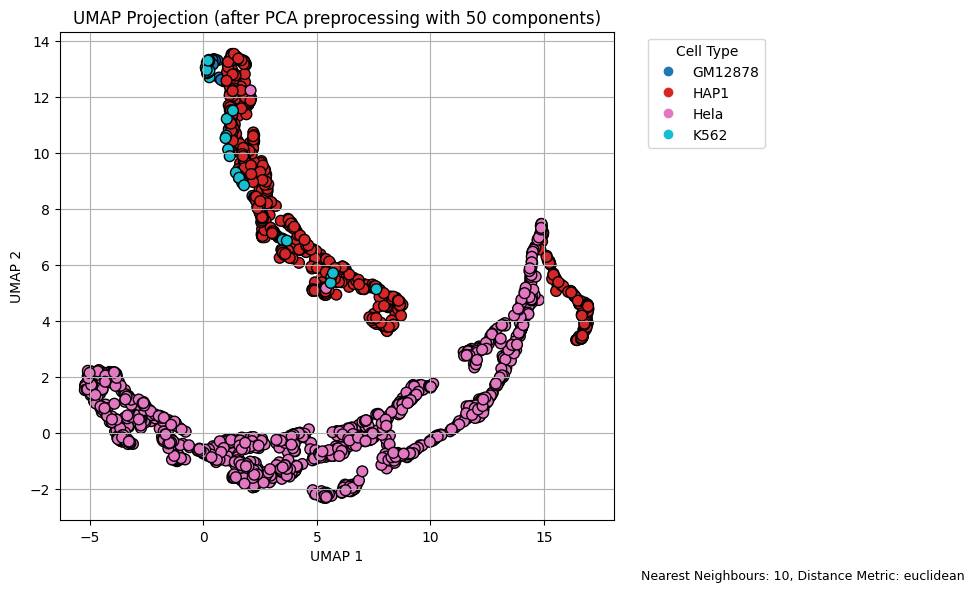

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


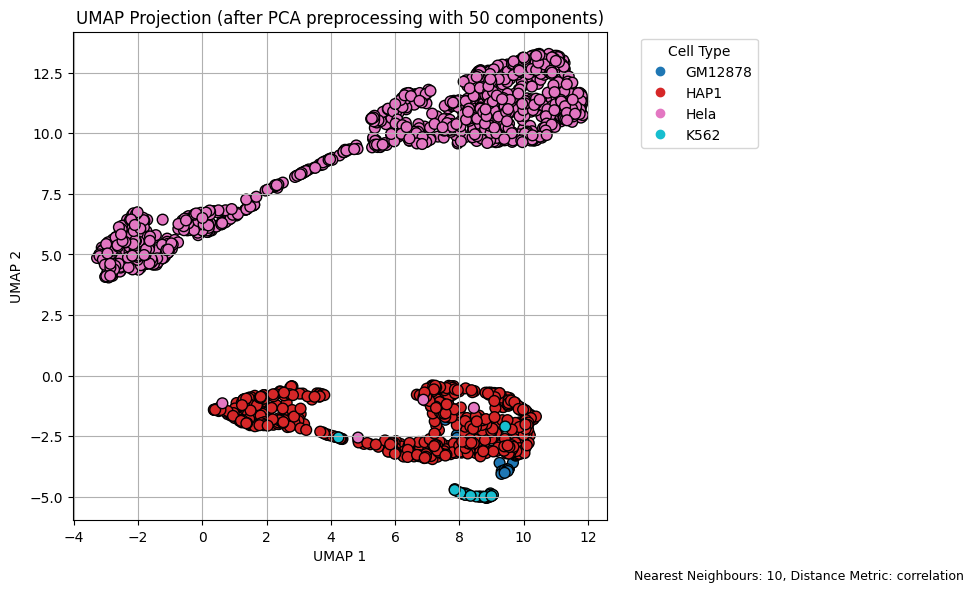

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


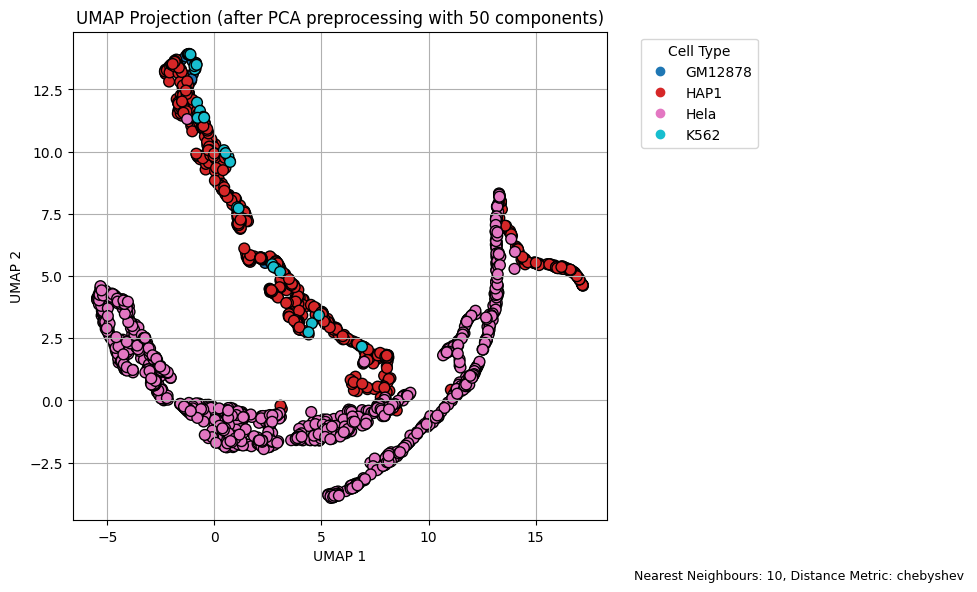

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


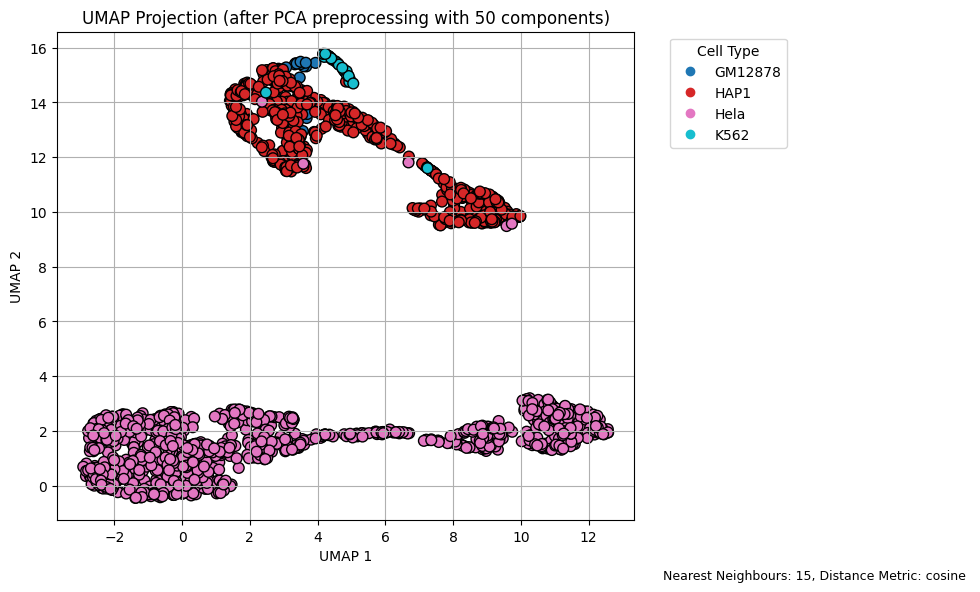

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


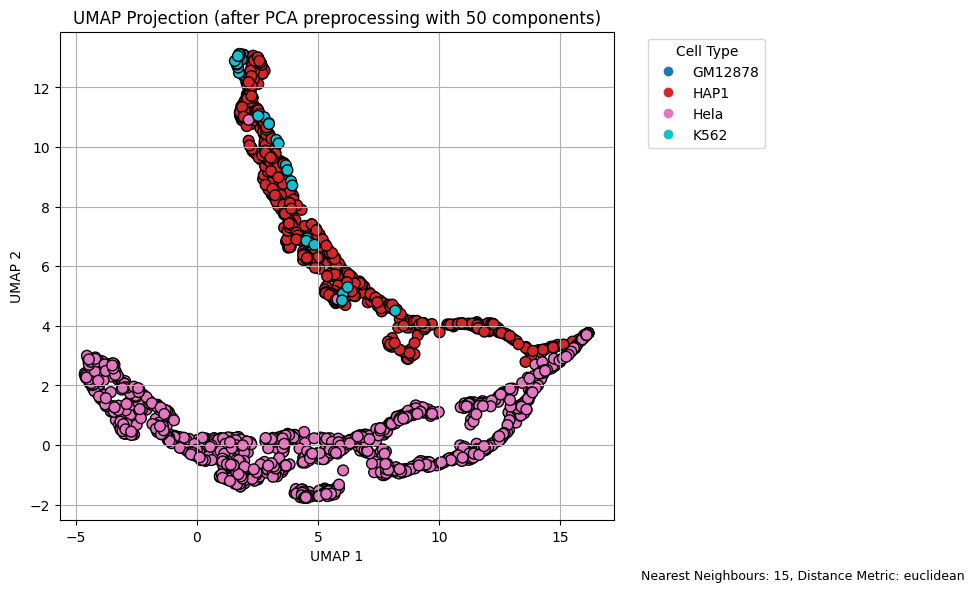

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


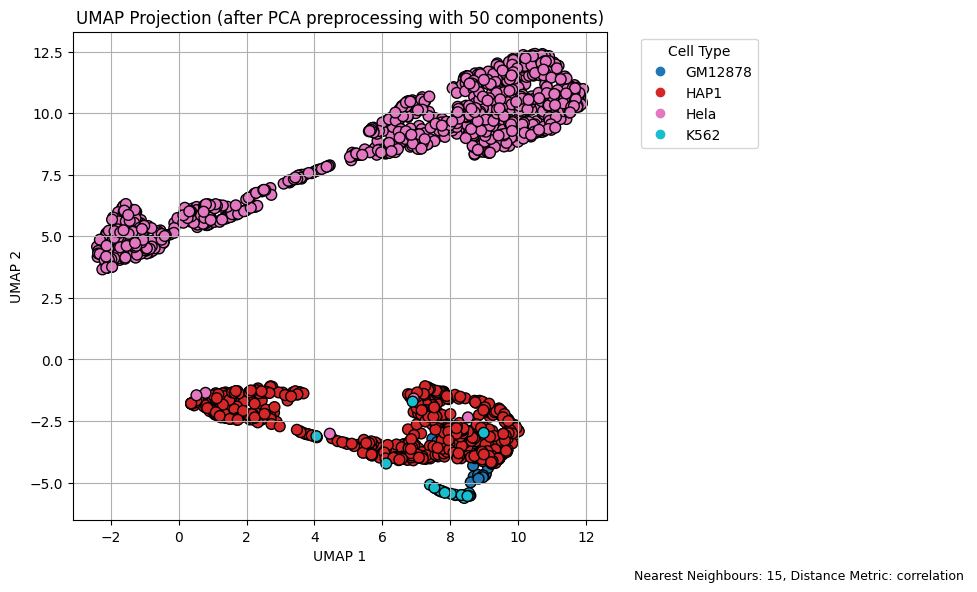

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


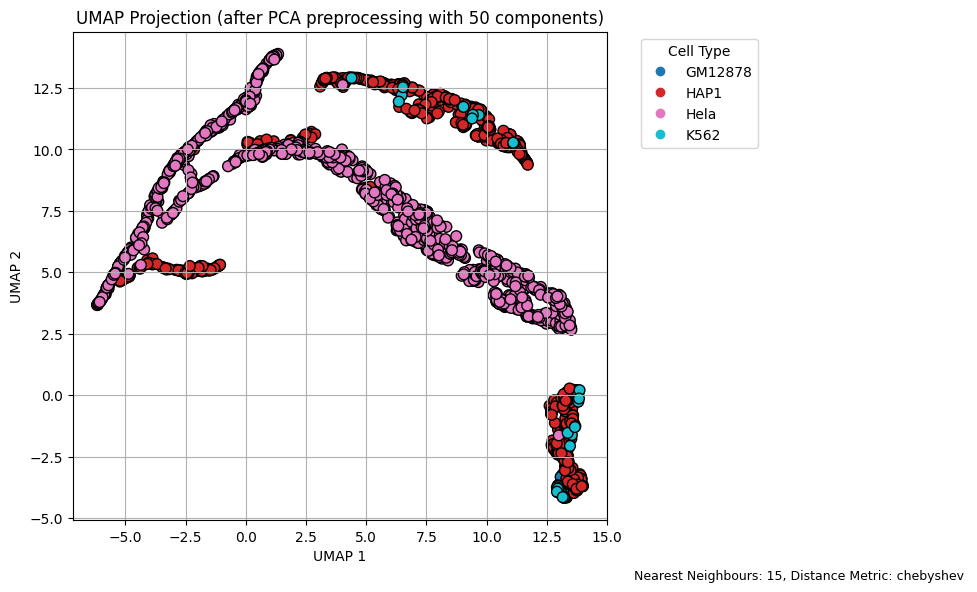

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


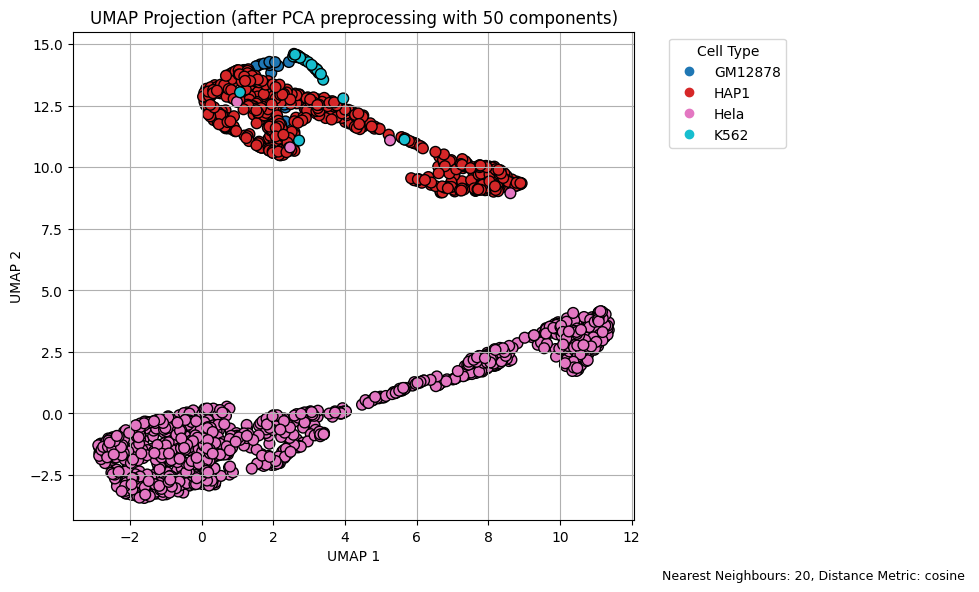

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


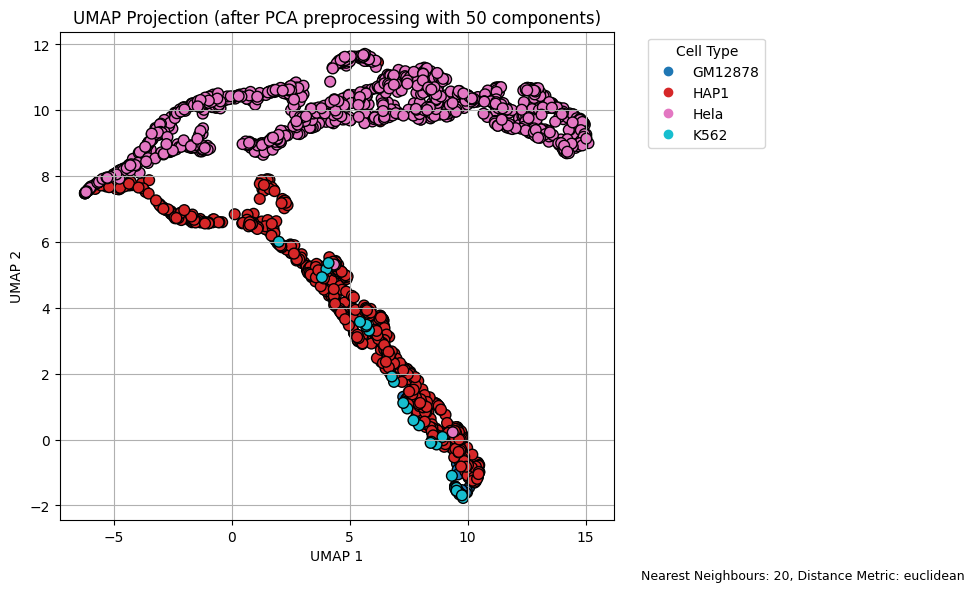

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


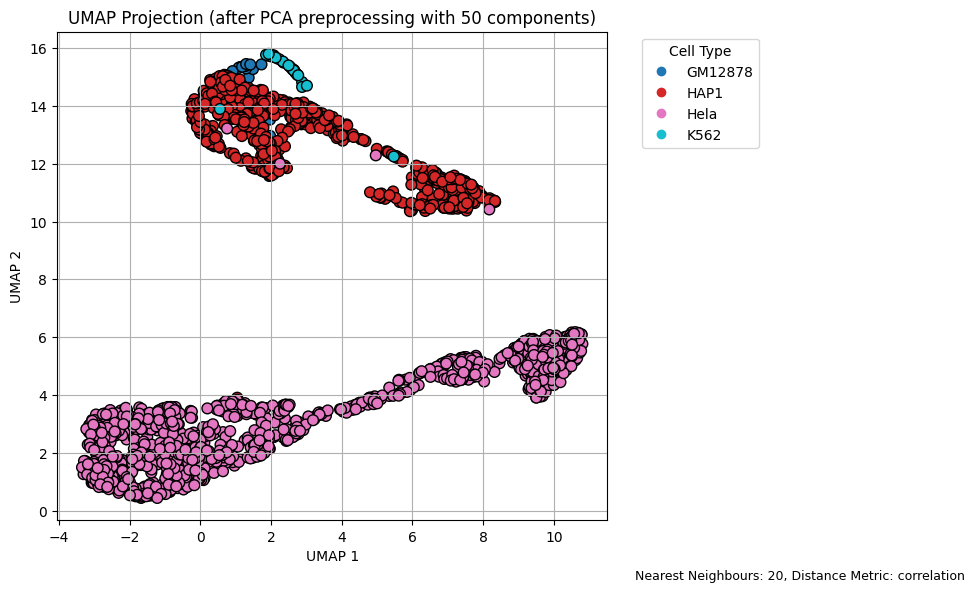

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


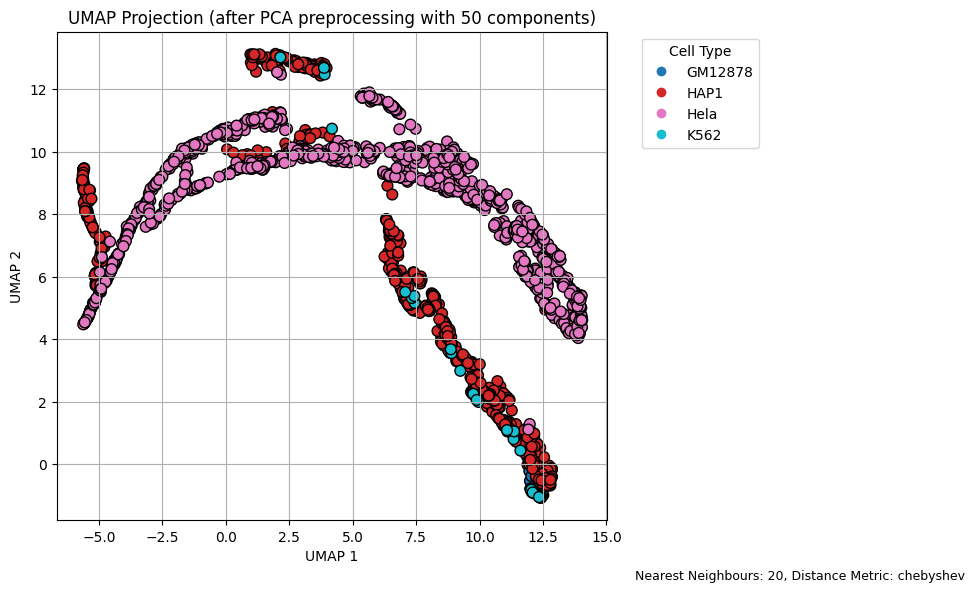

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


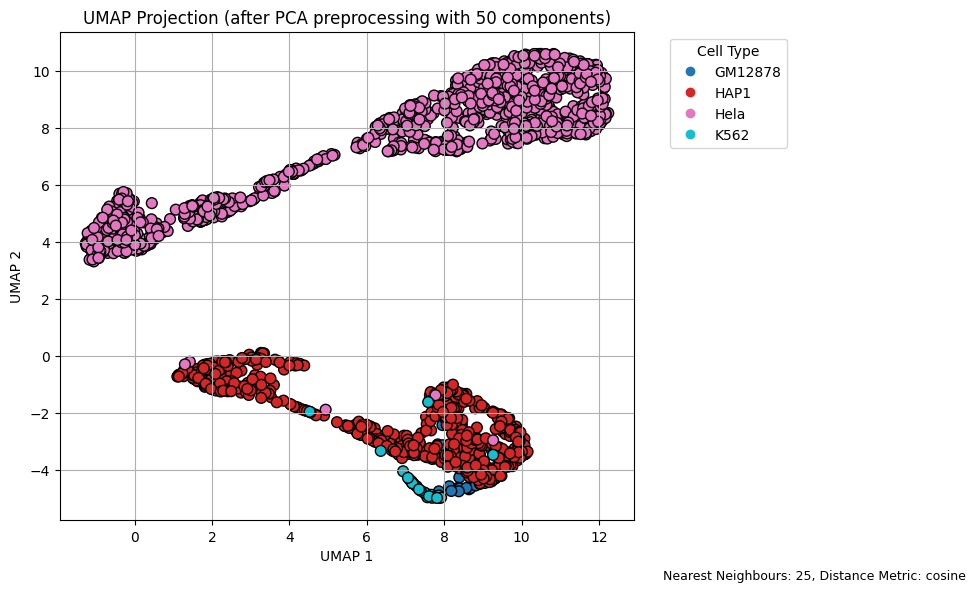

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


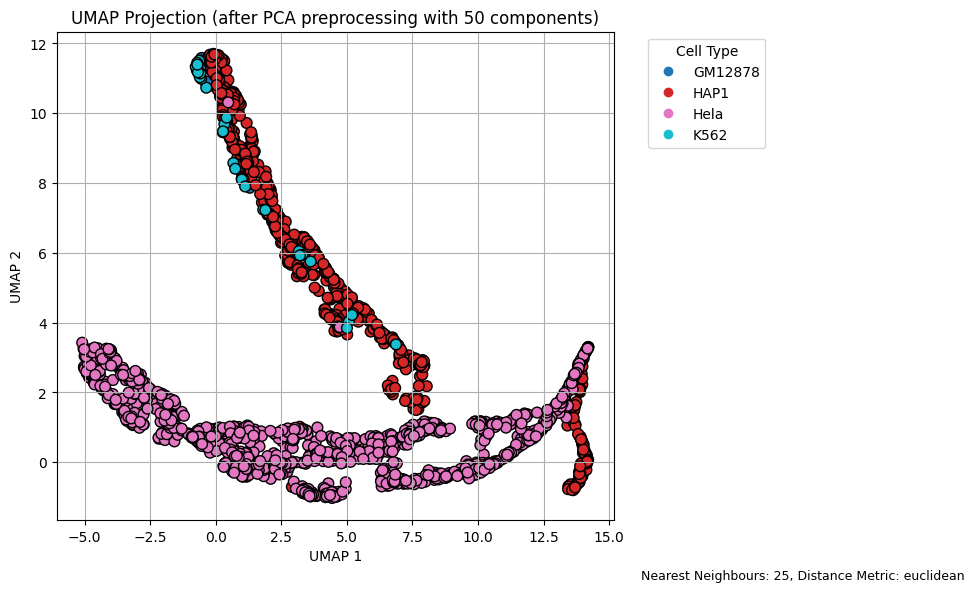

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


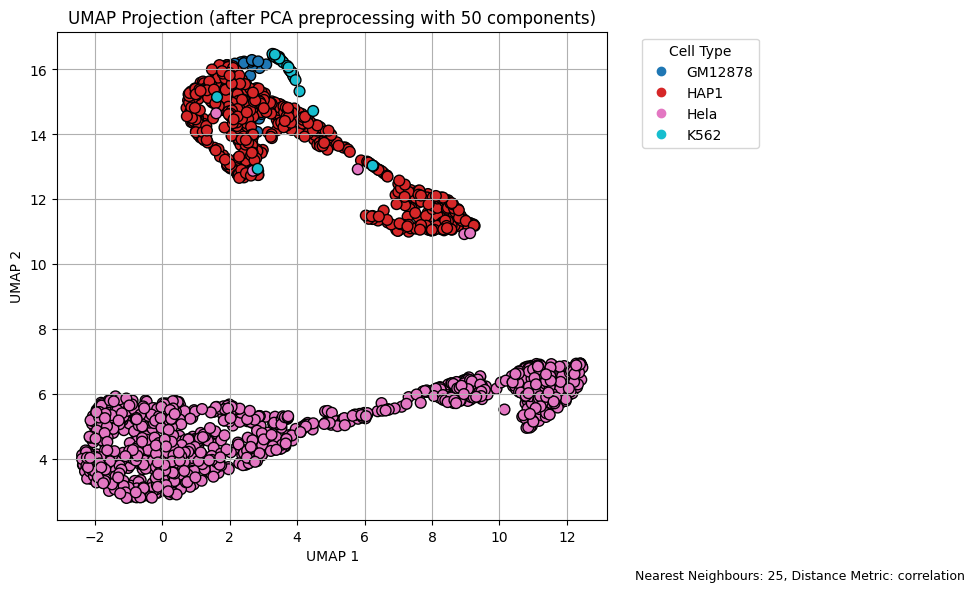

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


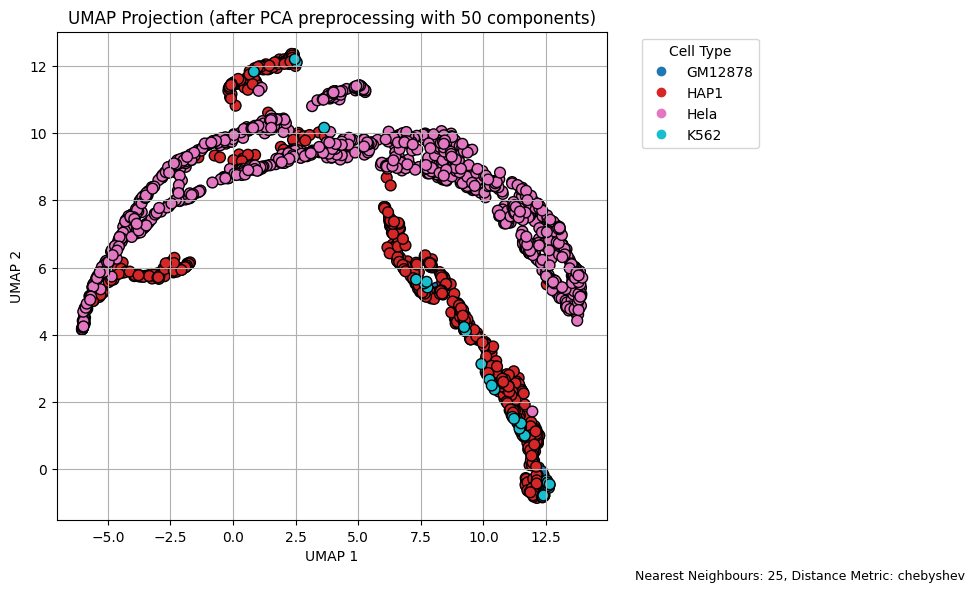

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


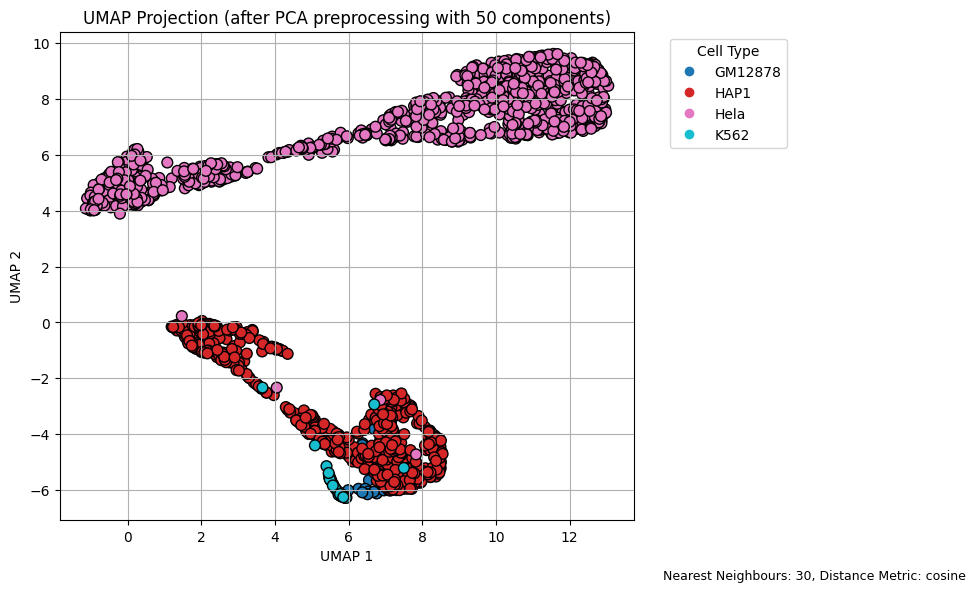

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


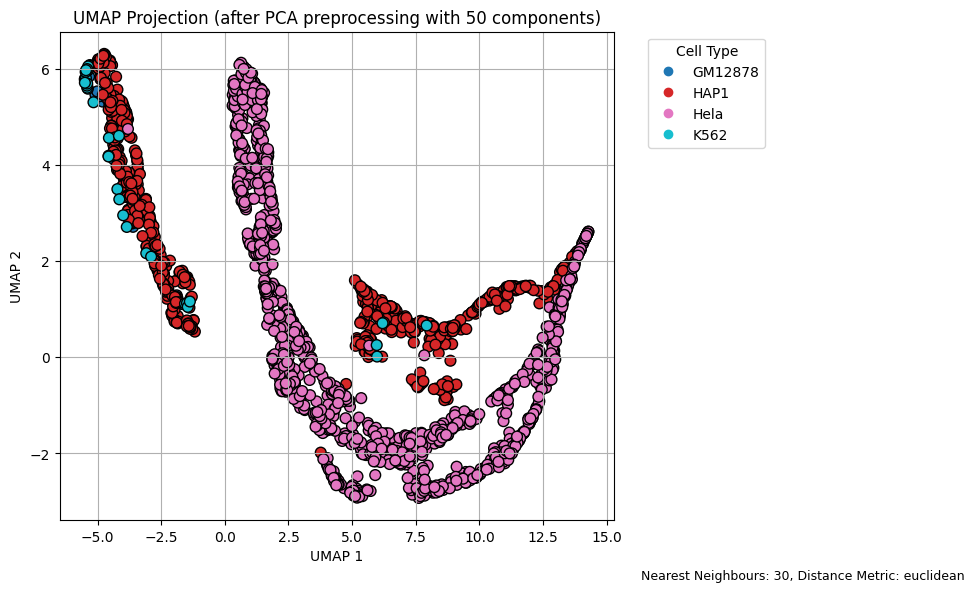

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


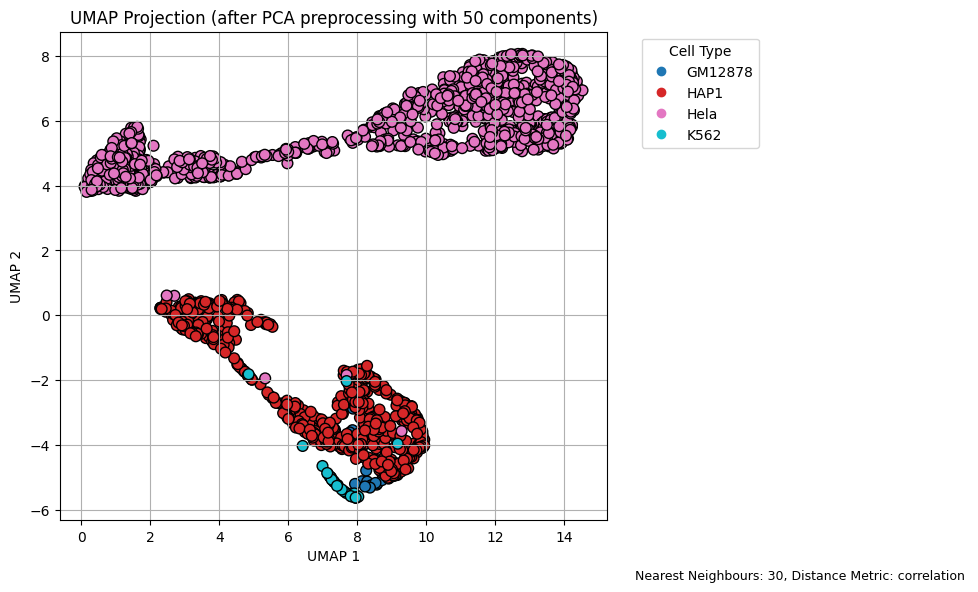

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


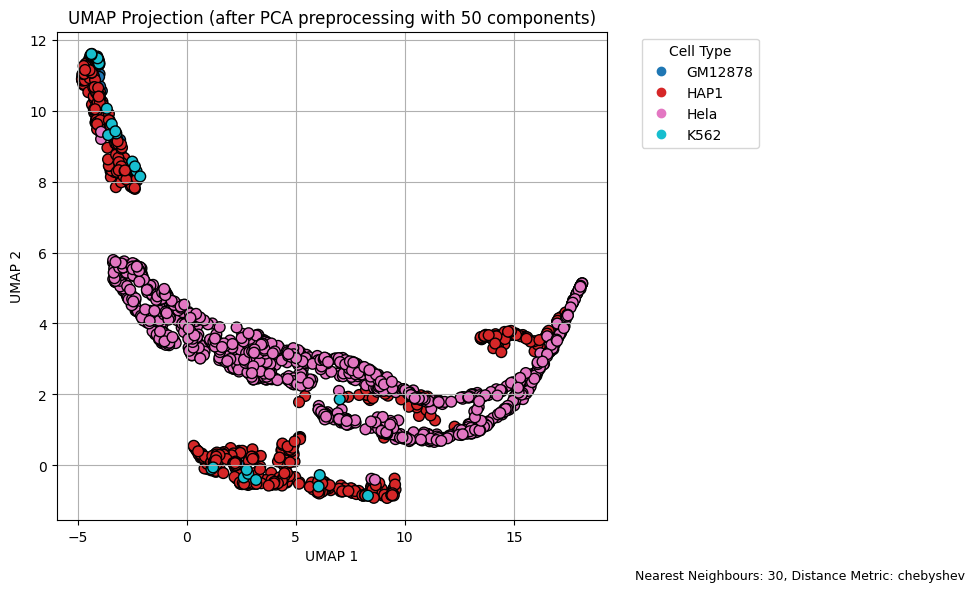

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


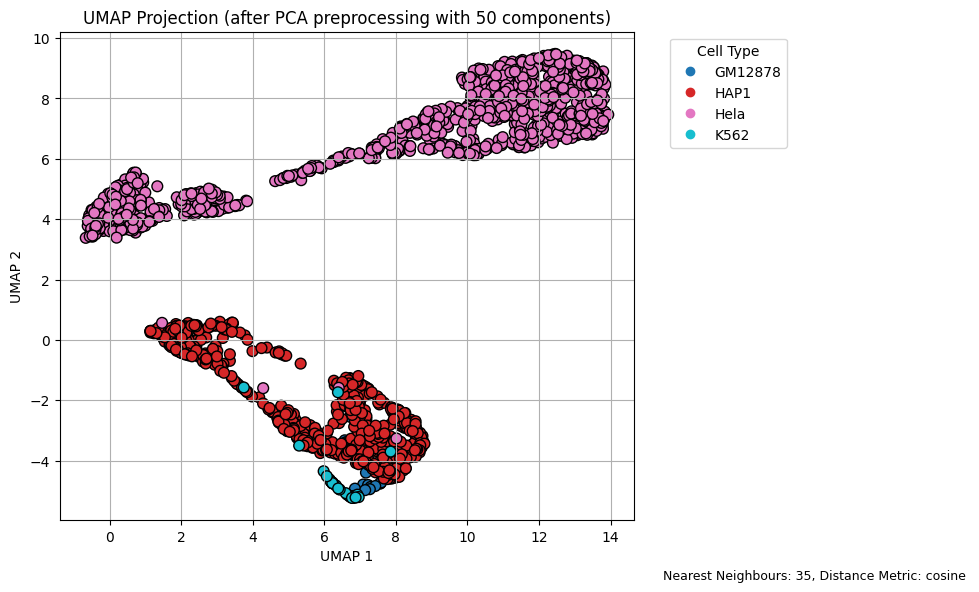

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


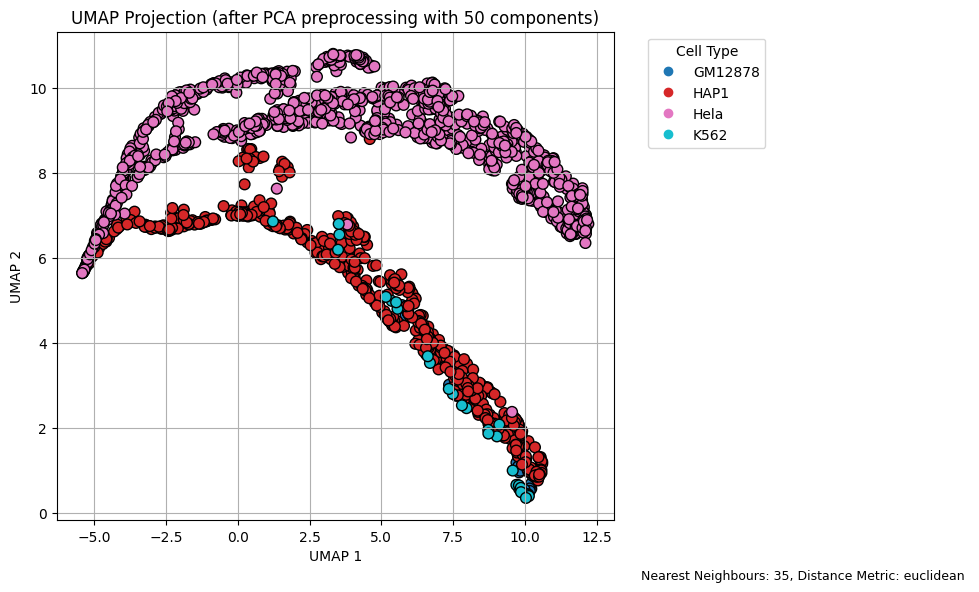

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


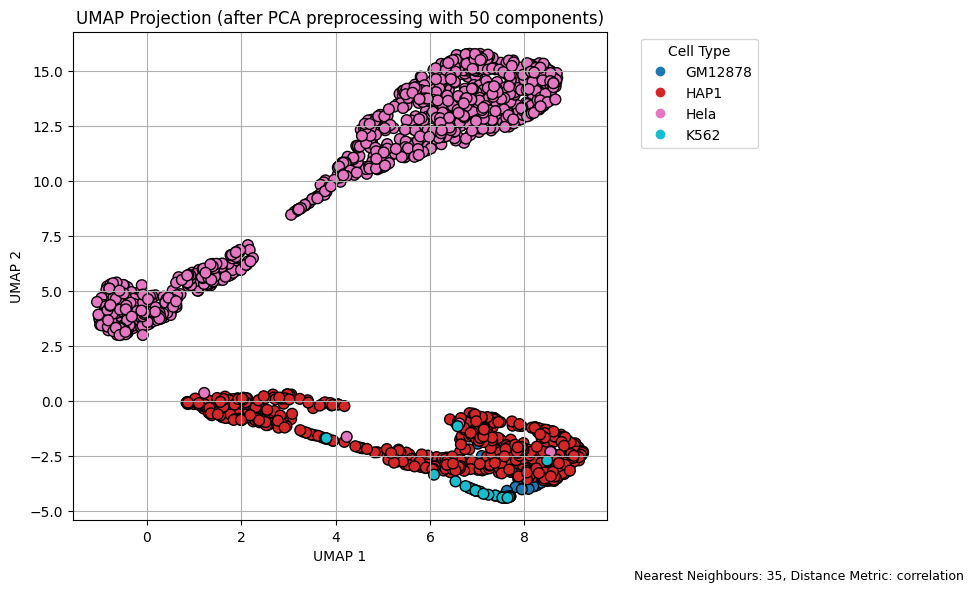

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


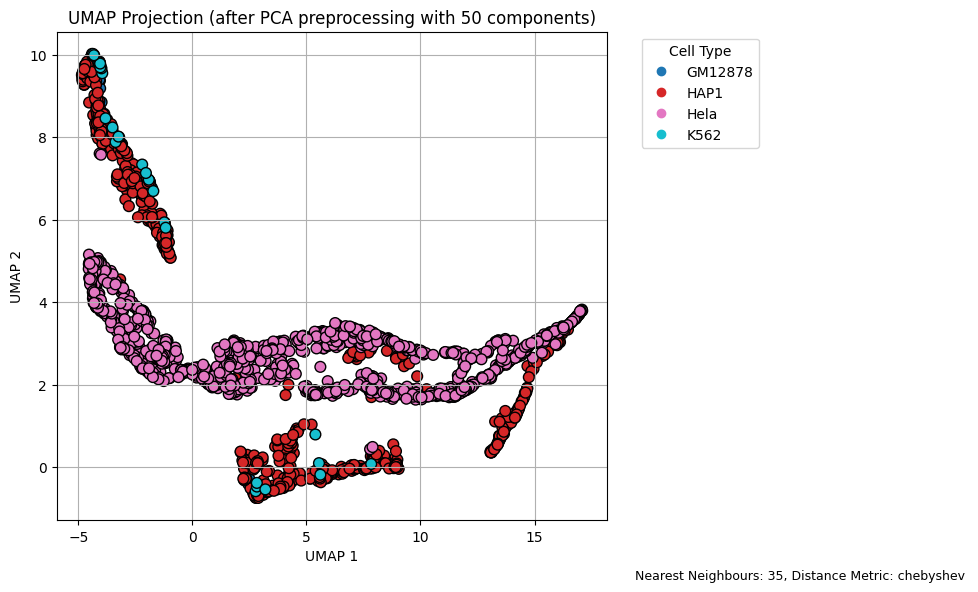

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


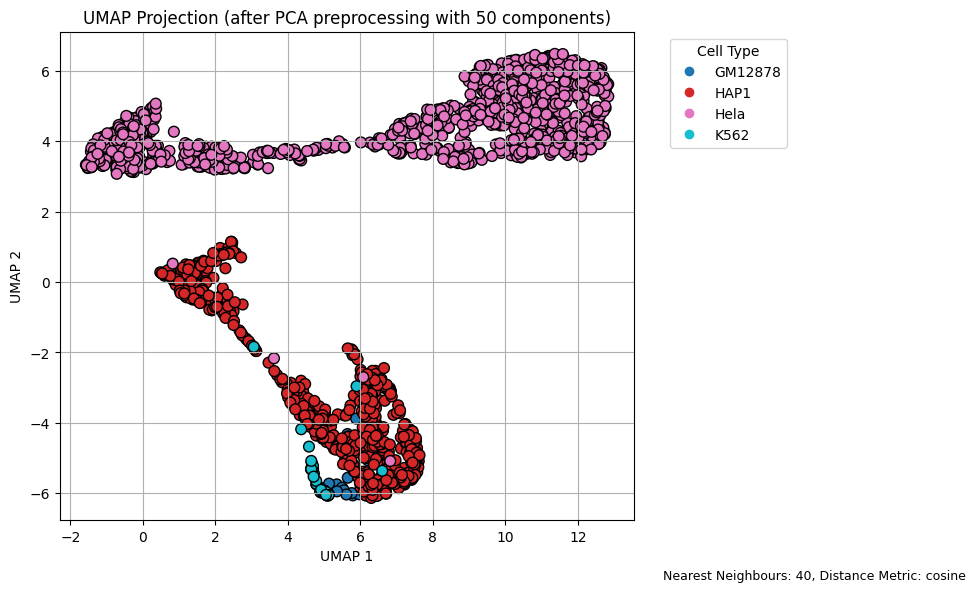

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


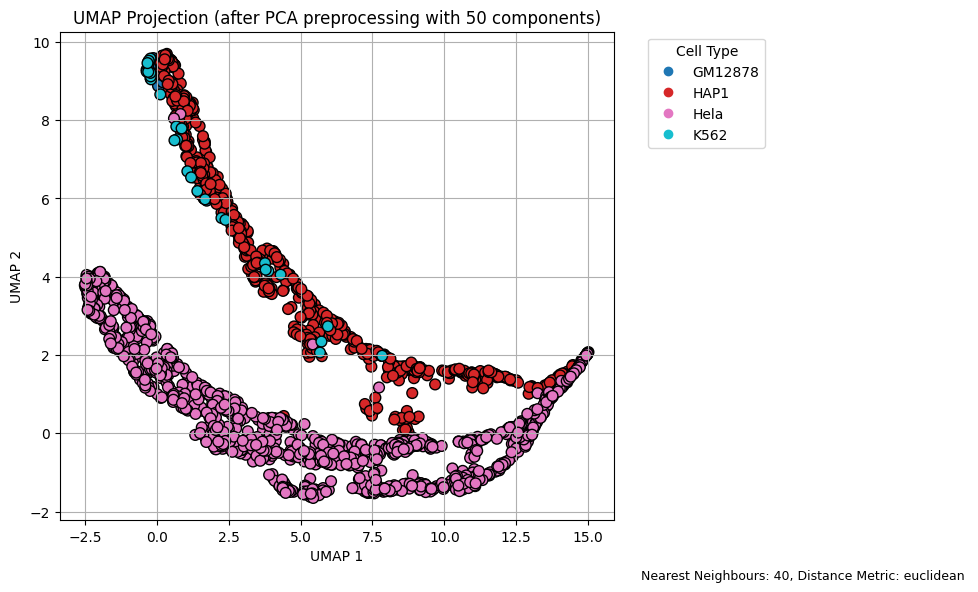

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


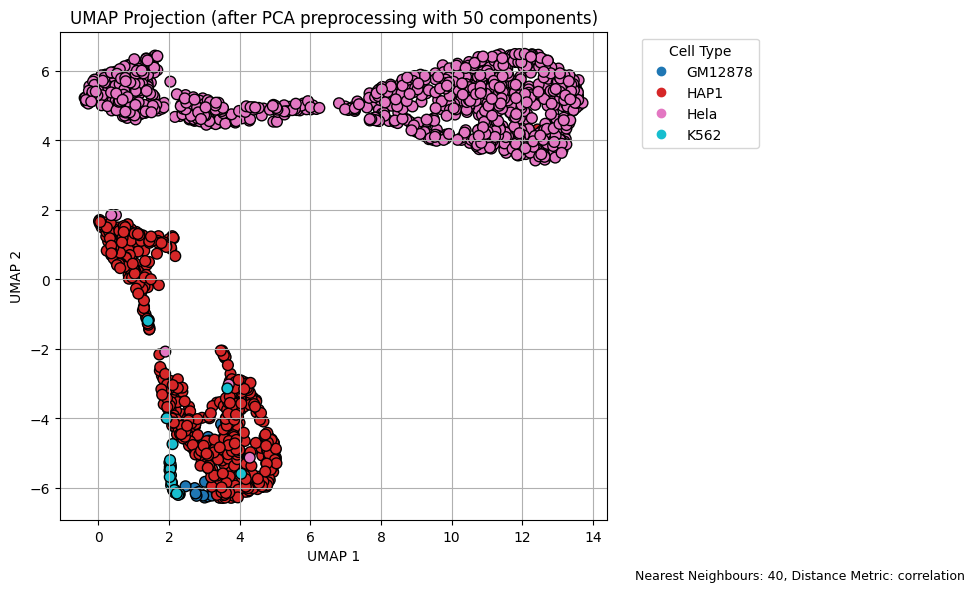

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


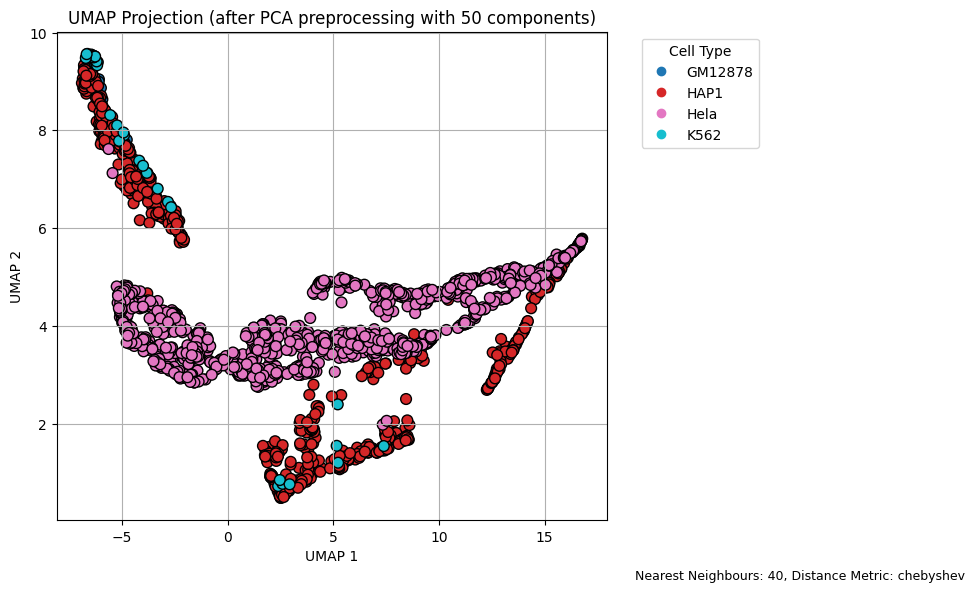

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


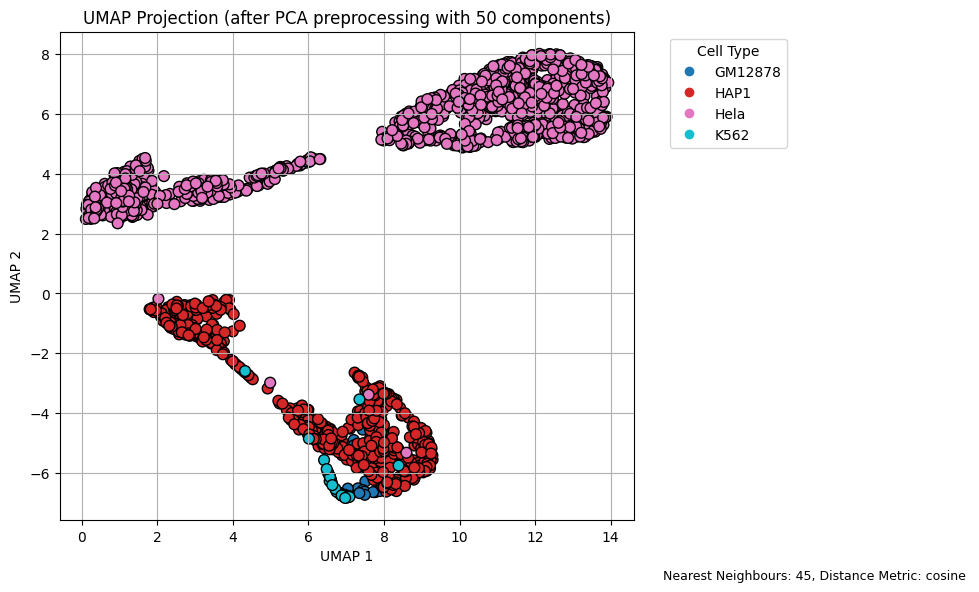

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


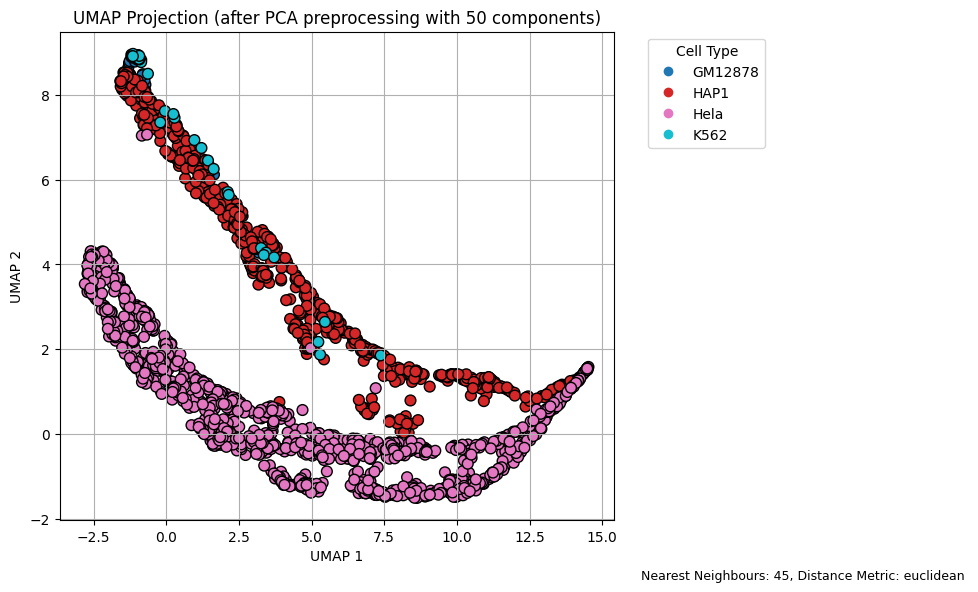

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


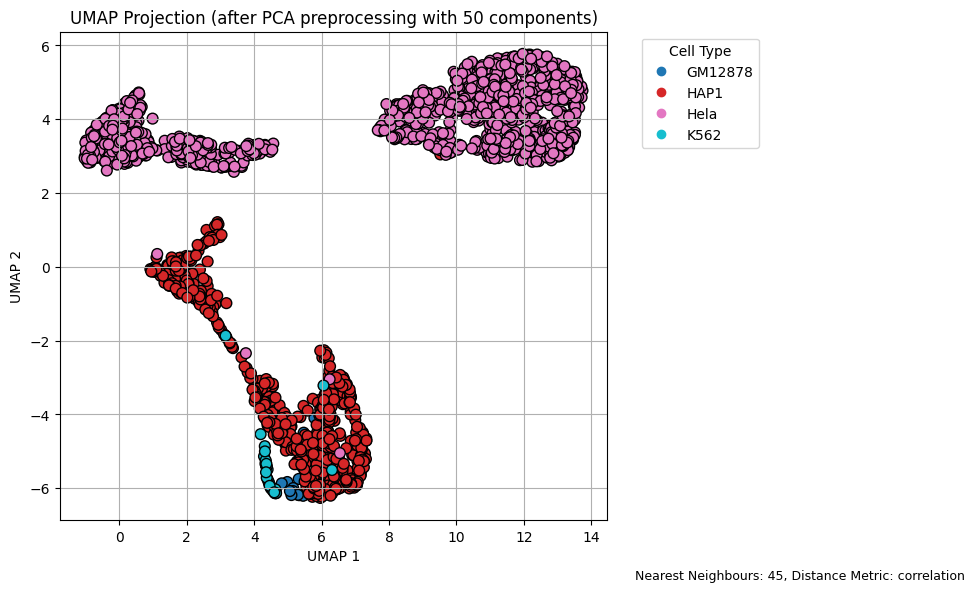

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


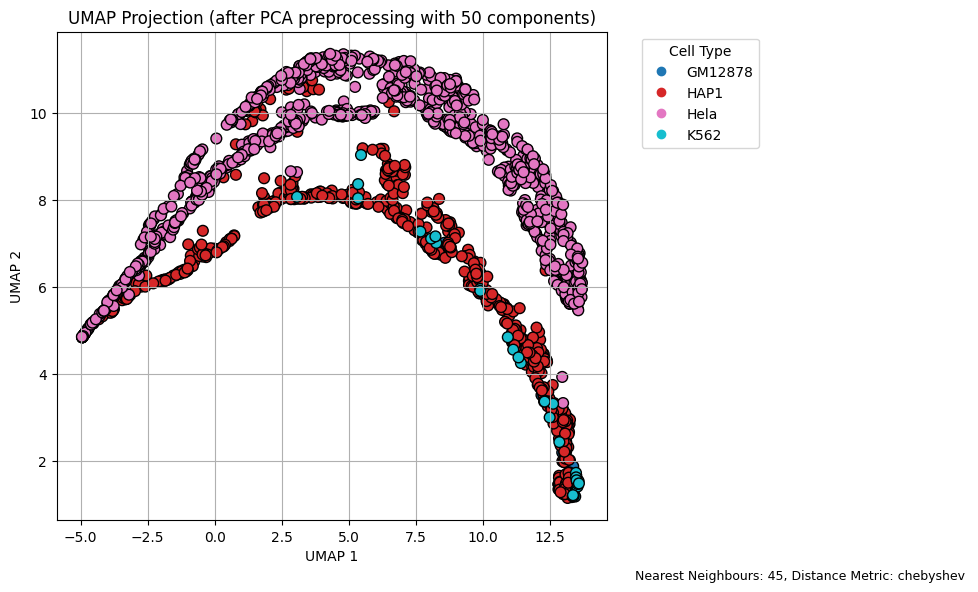

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


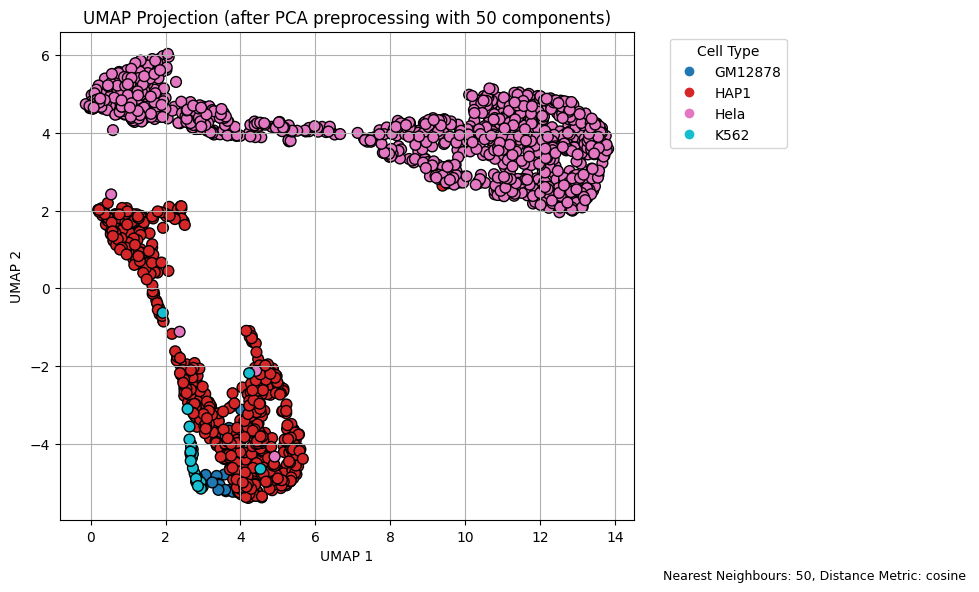

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


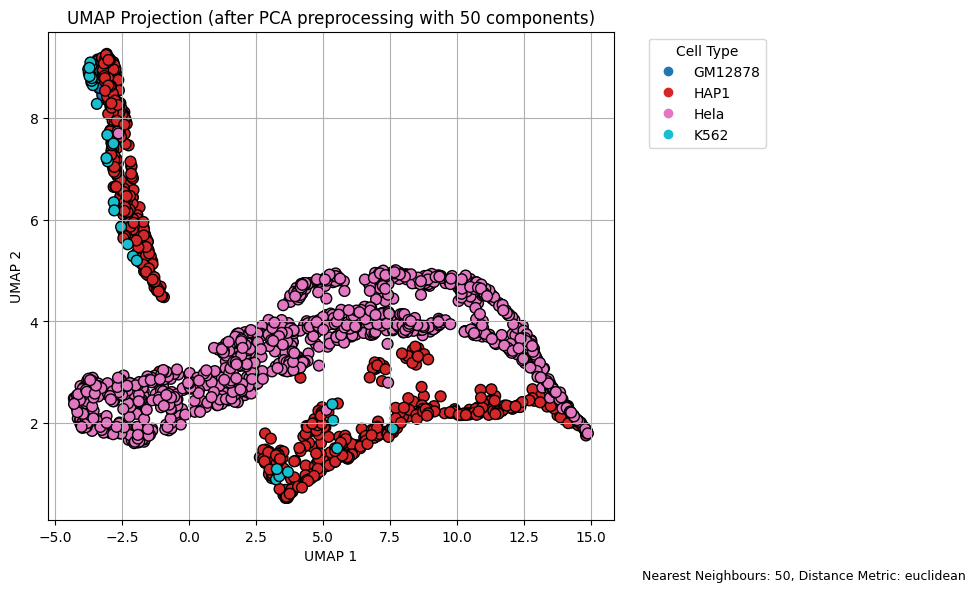

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


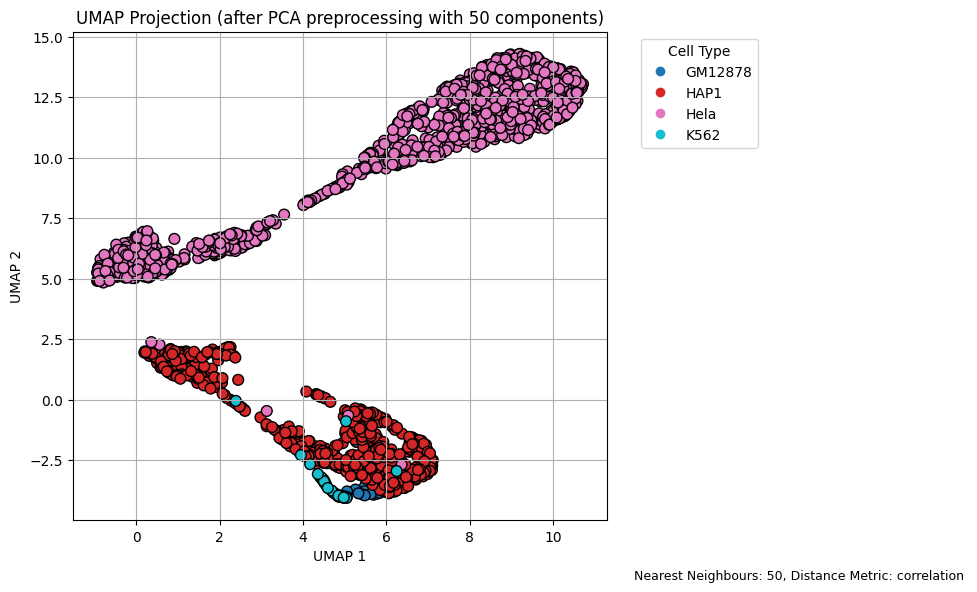

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


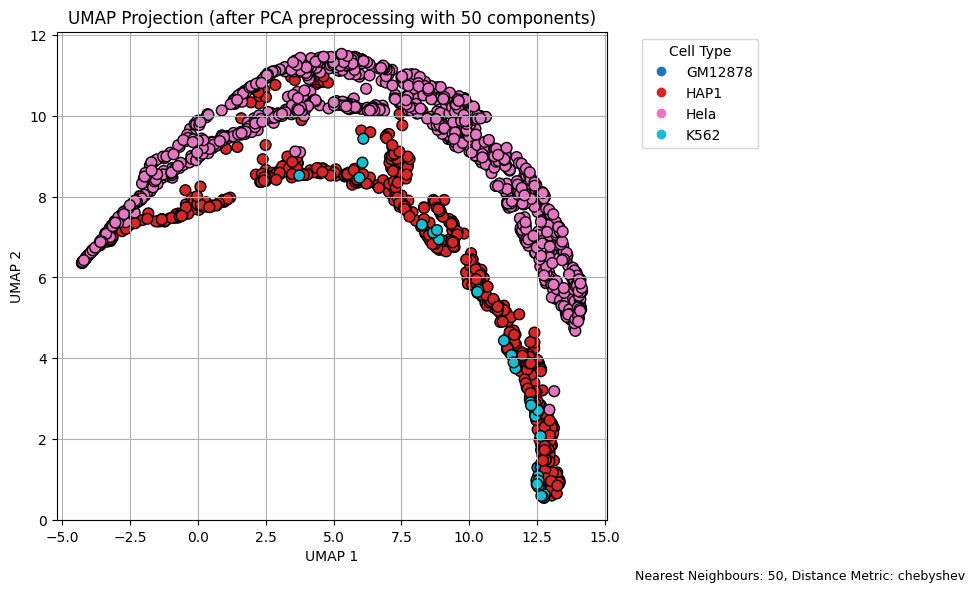

In [43]:
from sklearn.decomposition import PCA
import umap

dist_metrics = ['cosine', 'euclidean', 'correlation', 'chebyshev']

for i in range (1,11):
    for j in range(4):
        # First reduce to ~10–50 dimensions
        pca_components = 50
        num_neighbours = 5*i
        dist_metric = dist_metrics[j]
        min_distance= 0.1



        pca = PCA(n_components=pca_components)
        X_pca = pca.fit_transform(X_scaled)

        reducer = umap.UMAP(n_components=2, n_neighbors=num_neighbours, min_dist=min_distance, metric=dist_metric, random_state=42)
        X_umap = reducer.fit_transform(X_pca)



        plt.figure(figsize=(10, 6))
        scatter = plt.scatter(
            X_umap[:, 0], X_umap[:, 1],
            c=cell_type_codes,
            cmap='tab10',
            edgecolor='k',
            s=60
        )

        handles, _ = scatter.legend_elements()
        plt.legend(handles, cell_type_labels, title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.text(
        1.05, -0.1,  # x and y (in axes fraction if using plt.gcf().transFigure)
        f"Nearest Neighbours: {num_neighbours}, Distance Metric: {dist_metric} ",
        transform=plt.gca().transAxes,  # place relative to axes (not data coords)
        fontsize=9,
        va='top'
    )
        plt.title(f"UMAP Projection (after PCA preprocessing with {pca_components} components)")
        plt.xlabel("UMAP 1")
        plt.ylabel("UMAP 2")

        plt.grid(True)
        plt.tight_layout()
        plt.show()

In [ ]:
from sklearn.decomposition import PCA
import umap

dist_metrics = ['cosine','correlation']

for i in range (2):
    for j in range(1,11):
        # First reduce to ~10–50 dimensions
        pca_components = 50
        num_neighbours = 5*j
        dist_metric = dist_metrics[i]
        min_distance= 0.1



        pca = PCA(n_components=pca_components)
        X_pca = pca.fit_transform(X_scaled)

        reducer = umap.UMAP(n_components=2, n_neighbors=num_neighbours, min_dist=min_distance, metric=dist_metric, random_state=42)
        X_umap = reducer.fit_transform(X_pca)



        plt.figure(figsize=(10, 6))
        scatter = plt.scatter(
            X_umap[:, 0], X_umap[:, 1],
            c=cell_type_codes,
            cmap='tab10',
            edgecolor='k',
            s=60
        )

        handles, _ = scatter.legend_elements()
        plt.legend(handles, cell_type_labels, title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.text(
        1.05, -0.1,  # x and y (in axes fraction if using plt.gcf().transFigure)
        f"Nearest Neighbours: {num_neighbours}, Distance Metric: {dist_metric} ",
        transform=plt.gca().transAxes,  # place relative to axes (not data coords)
        fontsize=9,
        va='top'
    )
        plt.title(f"UMAP Projection (after PCA preprocessing with {pca_components} components)")
        plt.xlabel("UMAP 1")
        plt.ylabel("UMAP 2")

        plt.grid(True)
        plt.tight_layout()
        plt.show()

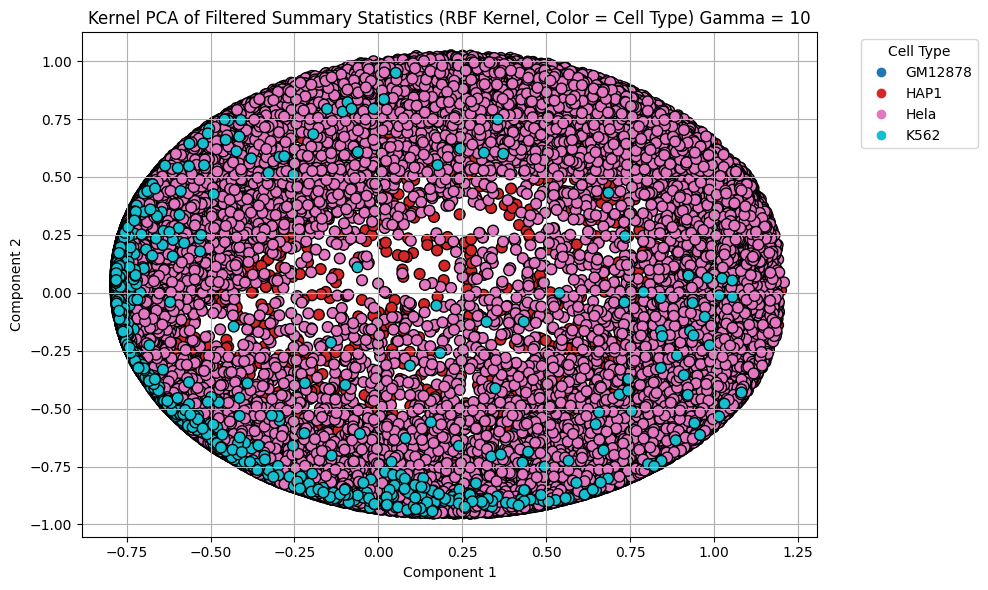

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


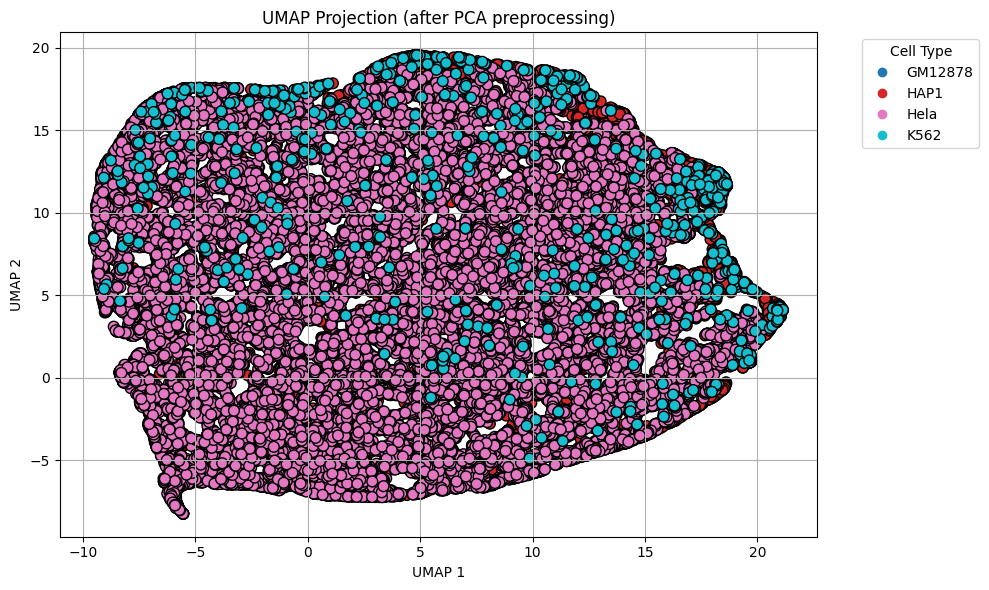

In [ ]:
kpca = KernelPCA(n_components=2, kernel='poly', degree=3, coef0=1, gamma=1)  # try 0.01, 0.1, 1 depending on scale
X_kpca = kpca.fit_transform(X_scaled)


plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    X_kpca[:, 0], X_kpca[:, 1],
    c=cell_type_codes,
    cmap='tab10',
    edgecolor='k',
    s=60
)

    # Optional: annotate chromosomes
    #for i, chrom in enumerate(df_filtered["chromosome"]):
      #  plt.text(X_kpca[i, 0], X_kpca[i, 1], chrom, fontsize=8, alpha=0.5)

handles, _ = scatter.legend_elements()
plt.legend(handles, cell_type_labels, title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title(f"Kernel PCA of Summary Statistics (RBF Kernel, Color = Cell Type)")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.tight_layout()
plt.show()


reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='euclidean', random_state=42)
X_umap = reducer.fit_transform(X_pca)



plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    X_umap[:, 0], X_umap[:, 1],
    c=cell_type_codes,
    cmap='tab10',
    edgecolor='k',
    s=60
)

handles, _ = scatter.legend_elements()
plt.legend(handles, cell_type_labels, title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title(f"UMAP Projection (after PCA preprocessing)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.grid(True)
plt.tight_layout()
plt.show()




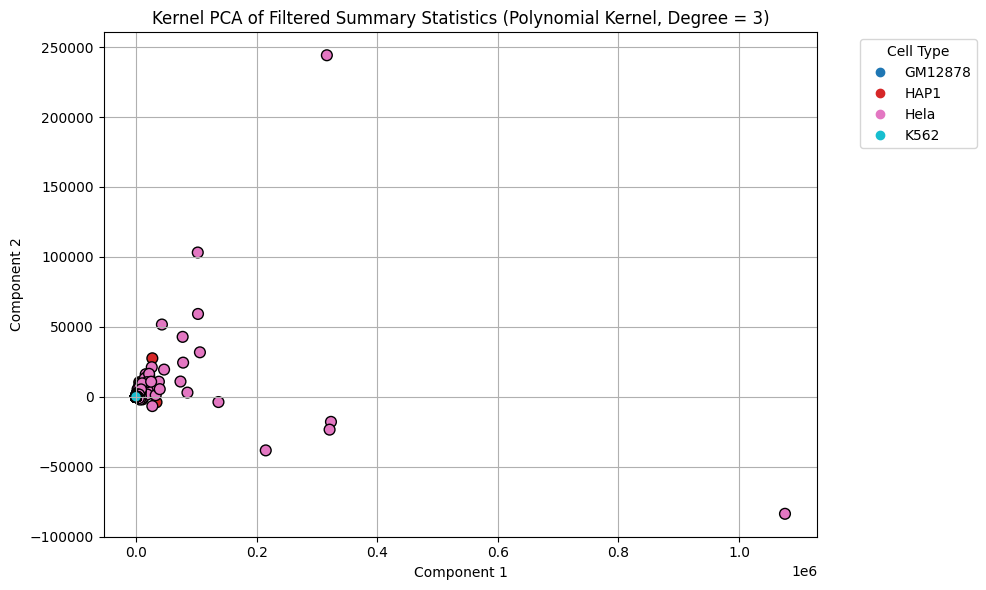

In [12]:
from sklearn.decomposition import KernelPCA
import matplotlib.pyplot as plt

# Apply Kernel PCA with polynomial kernel (degree 3)
kpca = KernelPCA(n_components=2, kernel='poly', degree=3, coef0=1, gamma = 1)
X_kpca = kpca.fit_transform(X_scaled)

# Plot
plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    X_kpca[:, 0], X_kpca[:, 1],
    c=cell_type_codes,
    cmap='tab10',
    edgecolor='k',
    s=60
)

# Optional: annotate chromosomes
# for i, chrom in enumerate(df_filtered["chromosome"]):
#     plt.text(X_kpca[i, 0], X_kpca[i, 1], chrom, fontsize=8, alpha=0.5)

# Legend
handles, _ = scatter.legend_elements()
plt.legend(handles, cell_type_labels, title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.title("Kernel PCA of Filtered Summary Statistics (Polynomial Kernel, Degree = 3)")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.tight_layout()
plt.show()

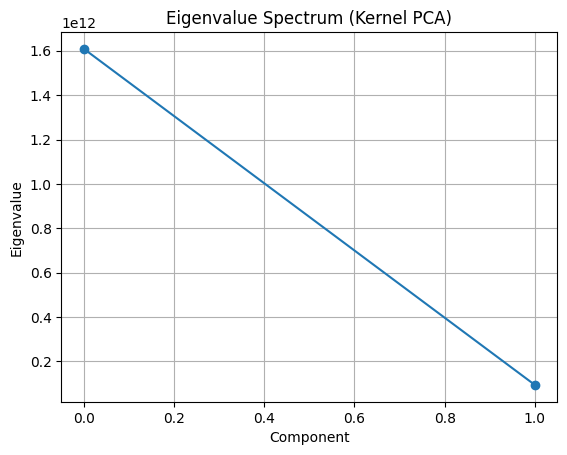

In [14]:
import matplotlib.pyplot as plt

plt.plot(kpca.eigenvalues_, marker='o')
plt.title("Eigenvalue Spectrum (Kernel PCA)")
plt.xlabel("Component")
plt.ylabel("Eigenvalue")
plt.grid(True)
plt.show()

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


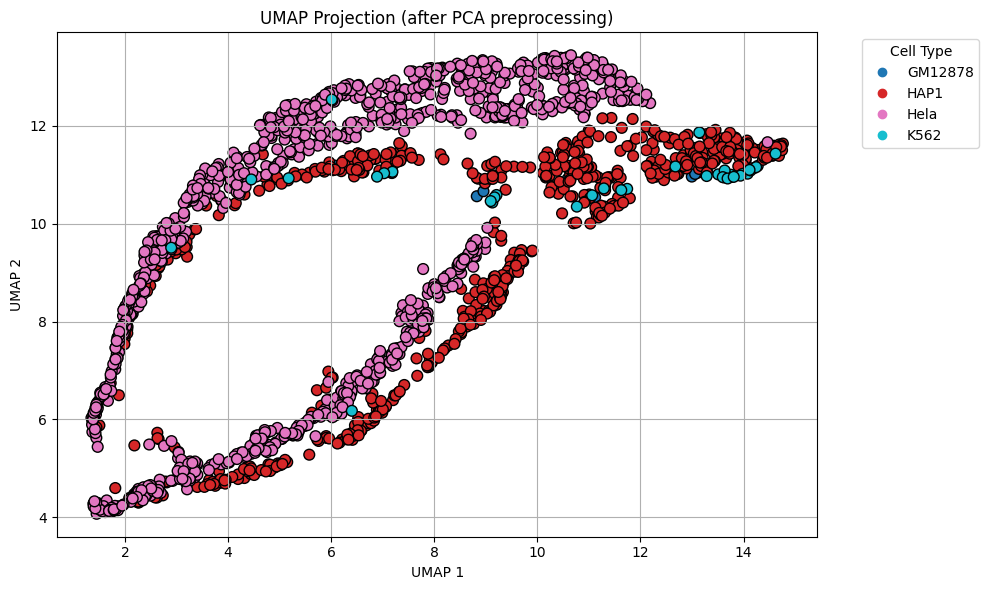

In [24]:
from sklearn.decomposition import PCA
import umap

# First reduce to ~10–50 dimensions
pca = PCA(n_components=9)
X_pca = pca.fit_transform(X_scaled)

reducer = umap.UMAP(n_components=2, n_neighbors=100, min_dist=0.1, metric='euclidean', random_state=42)
X_umap = reducer.fit_transform(X_pca)



plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    X_umap[:, 0], X_umap[:, 1],
    c=cell_type_codes,
    cmap='tab10',
    edgecolor='k',
    s=60
)

handles, _ = scatter.legend_elements()
plt.legend(handles, cell_type_labels, title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title(f"UMAP Projection (after PCA preprocessing)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.grid(True)
plt.tight_layout()
plt.show()

c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
c:\Users\benja\AppData\Local\Programs\Python\Python313\Lib\site-packages\umap\umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


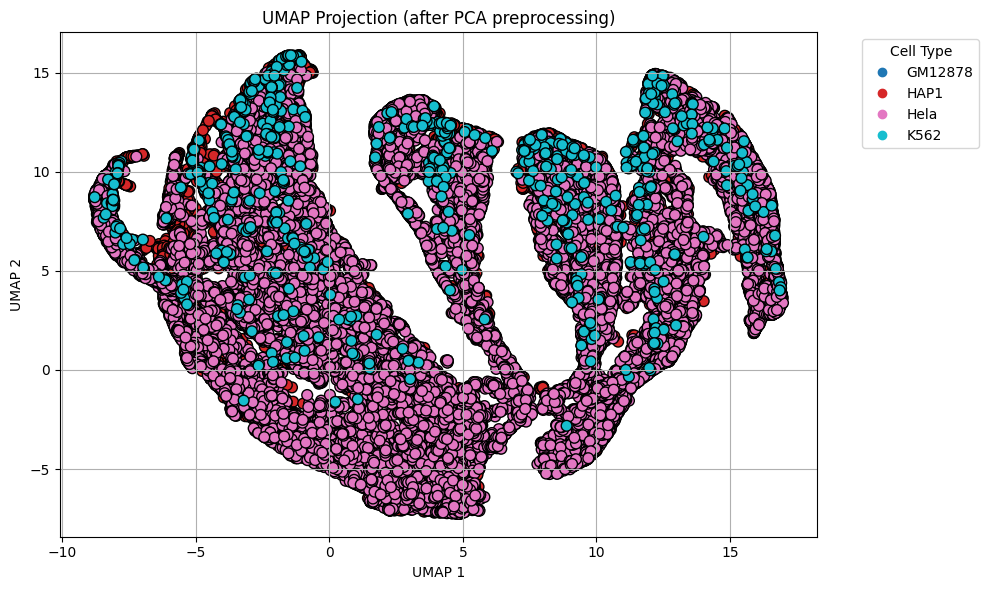

In [18]:
from sklearn.decomposition import PCA
import umap

# First reduce to ~10–50 dimensions
pca = PCA(n_components=9)
X_pca = pca.fit_transform(X_scaled)

reducer = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='cosine', random_state=42)
X_umap = reducer.fit_transform(X_pca)



plt.figure(figsize=(10, 6))
scatter = plt.scatter(
    X_umap[:, 0], X_umap[:, 1],
    c=cell_type_codes,
    cmap='tab10',
    edgecolor='k',
    s=60
)

handles, _ = scatter.legend_elements()
plt.legend(handles, cell_type_labels, title="Cell Type", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("UMAP Projection (after PCA preprocessing)")
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")
plt.grid(True)
plt.tight_layout()
plt.show()